# Introduction to neural network classification with TensorFlow

In this notebook we're going to learn how to write neural networks for classification problems.

A classification problem is where you try to classifiy somthing as one thing or another.

Types of Classification problems:
* Binary
* Multiclass
* Multilabel

# Creating data to view and fit

In [ ]:
from sklearn.datasets import make_circles

# Make 1000 examples
n_samples = 1000

# Create circles
X, y = make_circles(n_samples, 
                    noise = 0.03, 
                    random_state = 42)


In [ ]:
# Check out the features:
X

array([[ 0.75424625,  0.23148074],
       [-0.75615888,  0.15325888],
       [-0.81539193,  0.17328203],
       ...,
       [-0.13690036, -0.81001183],
       [ 0.67036156, -0.76750154],
       [ 0.28105665,  0.96382443]])

In [ ]:
# Check out the labels:
y[:10]

array([1, 1, 1, 1, 0, 1, 1, 1, 1, 0])

Our data is a bit hard to understand. Therefore we should visualize it!

In [ ]:
import pandas as pd
circles = pd.DataFrame({'X0':X[:, 0], 'X1':X[:, 1], 'label':y})
circles

,X0,X1,label
0,0.754246,0.231481,1
1,-0.756159,0.153259,1
2,-0.815392,0.173282,1
3,-0.393731,0.692883,1
4,0.442208,-0.896723,0
...,...,...,...
995,0.244054,0.944125,0
996,-0.978655,-0.272373,0
997,-0.136900,-0.810012,1
998,0.670362,-0.767502,0


In [ ]:
circles.count()

X0       1000
X1       1000
label    1000
dtype: int64

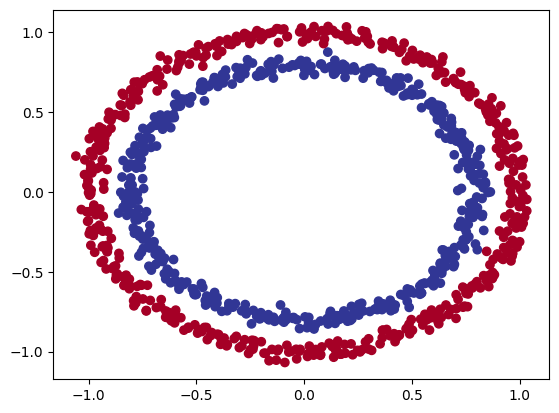

In [ ]:
# Visualize with a plot:
import matplotlib.pyplot as plt
plt.scatter(X[:, 0], X[:, 1], c = y, cmap = plt.cm.RdYlBu);

# Input and output shapes

In [ ]:
# Check the shapes of our features and labels:
X.shape, y.shape

((1000, 2), (1000,))

In [ ]:
# Check how many samples we're working with:
len(X), len(y)

(1000, 1000)

In [ ]:
# View the first example of features and labels
X[0], y[0]

(array([0.75424625, 0.23148074]), 1)

### Check out this website:

* https://playground.tensorflow.org/
* https://cloud.google.com/blog/products/ai-machine-learning/understanding-neural-networks-with-tensorflow-playground

# Steps in Modeling

The steps in modeling in Tensorflow are typically:
1. Create or import a model
2. Compile the model
3. Fit the model
4. Evaluate the model
5. Tweak it
6. Evaluate it...



In [ ]:
from numpy import expand_dims
import tensorflow as tf

# Set random seed:
tf.random.set_seed(42)

# Create a model using the Sequential API
model_1 = tf.keras.Sequential([
    tf.keras.layers.Dense(1)
])

# Compile model:
model_1.compile(loss = tf.keras.losses.BinaryCrossentropy(), 
                optimizer = tf.keras.optimizers.SGD(), 
                metrics = ['accuracy']) # accuracy gives us the percentage of how many (out of 100) our model got right

# Fit the model:
model_1.fit(expand_dims(X, axis = 1), y, epochs = 5)

Epoch 1/5
32/32 [==============================] - 1s 2ms/step - loss: 2.8573 - accuracy: 0.4960
Epoch 2/5
32/32 [==============================] - 0s 1ms/step - loss: 0.7516 - accuracy: 0.5080
Epoch 3/5
32/32 [==============================] - 0s 2ms/step - loss: 0.7133 - accuracy: 0.4961
Epoch 4/5
32/32 [==============================] - 0s 2ms/step - loss: 0.6992 - accuracy: 0.4997
Epoch 5/5
32/32 [==============================] - 0s 1ms/step - loss: 0.6960 - accuracy: 0.4967


In [ ]:
# trying to improve the model by training it longer...
model_1.fit(expand_dims(X, axis = 1), y, epochs = 200, verbose = 0)
model_1.evaluate(X, y)

32/32 [==============================] - 0s 1ms/step - loss: 0.6935 - accuracy: 0.5000


[0.6934717893600464, 0.5]

Since we're working on a binary classification problem and our model is getting around 50% accuracy is performing as it's is guessing.
Tehrefore, let's add an extra layer!

In [ ]:
# Set the random seed:
tf.random.set_seed(42)

# Create a model with 2 layers:
model_2 = tf.keras.Sequential([
    tf.keras.layers.Dense(1, activation = 'relu'), 
    tf.keras.layers.Dense(1)
])

# Compile model:
model_2.compile(loss = tf.keras.losses.BinaryCrossentropy(), 
                optimizer = tf.keras.optimizers.SGD(), 
                metrics = ['accuracy'])

# Fit the model:
model_2.fit(expand_dims(X, axis = 1), y, epochs = 100, verbose = 0)

In [ ]:
# Evaluate model:
model_2.evaluate(X, y)

32/32 [==============================] - 0s 1ms/step - loss: 7.7125 - accuracy: 0.5000


[7.712474346160889, 0.5]

In [ ]:
circles['label'].value_counts()

1    500
0    500
Name: label, dtype: int64

### Improving our model:

Looking into some tricks to see how this model can be improved

1. Create a model - we might try adding more layers OR increasing the number of hidden units within a layer.
2. Compile a model - we might want to choose a different optimization function such as SGD or Adam.
3. Fitting a model - we might fit it with more epochs (trainning it longer).



In [ ]:
# Set random seed:
tf.random.set_seed(42)

# Build model:
model_3 = tf.keras.Sequential([
    tf.keras.layers.Dense(100), # Add 100 dense neurons 
    tf.keras.layers.Dense(10), # Add another layer with 10 neurons
    tf.keras.layers.Dense(1)
])

# Compile model:
model_3.compile(loss = tf.keras.losses.BinaryCrossentropy(), 
                optimizer = tf.keras.optimizers.Adam(), 
                metrics = ['accuracy'])

# Fit model:
model_3.fit(expand_dims(X, axis = 1), y, epochs = 100, verbose = 0)

In [ ]:
model_3.evaluate(X, y)

32/32 [==============================] - 0s 1ms/step - loss: 0.6940 - accuracy: 0.5000


[0.6940131783485413, 0.5]

🔑 Note: Whenever your model is performing strangely or there's something going on with your data you're not quite sure of, remember these three words: visualize, visualize, visualize. Inspect your data, inspect your model, inpsect your model's predictions.

To visualize our model's predictions, let's create a function `plot_decision_boundary()`. This function will:

* Take in a trained model, features (x) and labels (y)
* Create a meshgrid of the different x values
* Make predictions accross the meshgrid
* Plot the predictions as well as a line between zones (where each unique class falls)



In [ ]:
# model_3.predict(x)

#### Creating a Function & a Meshgrid!

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_decision_boundary(model, X, y):
  """
  PLots the decision boundary created by a model predicting on x.
  """
  # Define the axis boundaries of the plot and cerate a meshgrid:
  x_min, x_max = X[:, 0].min() - 0.1, X[:, 0].max() + 0.1 # -0.1 and +0.1 are to give us a bit of a margin
  y_min, y_max = X[:, 1].min() - 0.1, X[:, 1].max() + 0.1 # Instead of getting index 0, we get index 1
  xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                       np.linspace(y_min, y_max, 100))
  
  # Create x value (we're going to make predictions on these)
  x_in = np.c_[xx.ravel(), yy.ravel()] # Stack 2D arrays together
  
  # Make predictions with our previously trained model
  y_pred = model.predict(x_in)

  # Check for multi-class
  if model.output_shape[-1] > 1: # If the final output is > (greater than) 1, then it's multi-class 
    print("doing multiclass classification...")
    # We have to reshape our predictions to get them ready for plotting
    y_pred = np.argmax(y_pred, axis=1).reshape(xx.shape)
  else:
    print("doing binary classifcation...")
    y_pred = np.round(np.max(y_pred, axis=1)).reshape(xx.shape)
  
  # Plot decision boundary
  plt.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7)
  plt.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.RdYlBu)
  plt.xlim(xx.min(), xx.max())
  plt.ylim(yy.min(), yy.max())

313/313 [==============================] - 0s 1ms/step
doing binary classifcation...


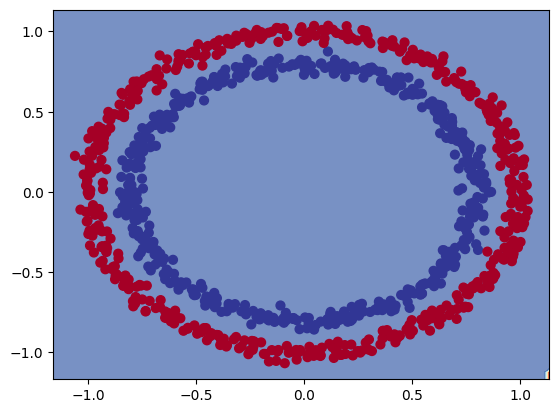

In [ ]:
# Check out the predictions our model is making:
plot_decision_boundary(model_3, 
                       X, 
                       y)

In [ ]:
# Checking if this model can be used in a regression problem:
tf.random.set_seed(42)

# Creating regression data:
X_regression = tf.range(0, 1000, 5)
y_regression = tf.range(100, 1100, 5) # y = X + 100

# Split our data into train and test sets:
X_reg_train = X_regression[:150]
X_reg_test = X_regression[150:]

y_reg_train = y_regression[:150]
y_reg_test = y_regression[150:]

# Fit our model to the regression data:
# model_3.fit(expand_dims(X_reg_train, axis = 1), y_reg_test, epochs = 100, verbose = 1)

In [ ]:
# Twicking model_3 to and adjust it to make it a regression problem:

# Set random seed
tf.random.set_seed(42)

# Build the model:
model_3 = tf.keras.Sequential([
    tf.keras.layers.Dense(100), 
    tf.keras.layers.Dense(10), 
    tf.keras.layers.Dense(1)
])

# Compile model:
model_3.compile(loss = tf.keras.losses.mae, 
                optimizer = tf.keras.optimizers.Adam(), 
                metrics = ['mae'])

# Fit the model:
model_3.fit(expand_dims(X_reg_train, axis = 1), y_reg_train, epochs = 100, verbose = 0)

2/2 [==============================] - 0s 6ms/step


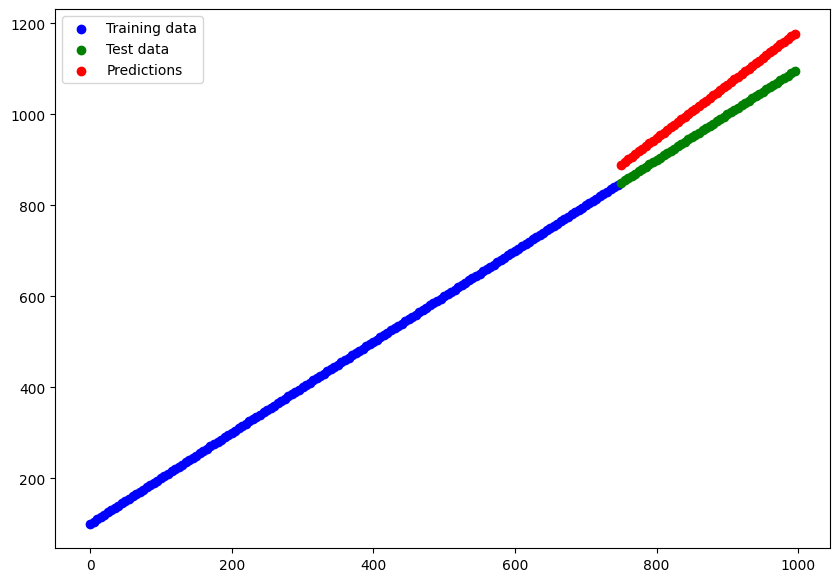

In [ ]:
# Make predictions with our trained model:
y_reg_preds = model_3.predict(X_reg_test)

# Plot the model's predictions against our regression data:
plt.figure(figsize = (10, 7))
plt.scatter(X_reg_train, y_reg_train, c = 'b', label = 'Training data')
plt.scatter(X_reg_test, y_reg_test, c = 'g', label = 'Test data')
plt.scatter(X_reg_test, y_reg_preds, c = 'r', label = 'Predictions')
plt.legend()

## The missing piece: Non-linearity

In [ ]:
# Set random seed:
tf.random.set_seed(42)

# Create model:
model_4 = tf.keras.Sequential([
    tf.keras.layers.Dense(1, activation = 'linear')
])

# Compile model:
model_4.compile(loss = 'binary_crossentropy', 
                optimizer = tf.keras.optimizers.Adam(lr = 0.001), 
                metrics = ['accuracy'])

# Fit model:
history = model_4.fit(expand_dims(X, axis = 1), y, epochs = 100)

Epoch 1/100
32/32 [==============================] - 1s 3ms/step - loss: 4.2283 - accuracy: 0.5000
Epoch 2/100
32/32 [==============================] - 0s 2ms/step - loss: 2.3947 - accuracy: 0.5000
Epoch 3/100
32/32 [==============================] - 0s 3ms/step - loss: 1.6665 - accuracy: 0.5000
Epoch 4/100
32/32 [==============================] - 0s 2ms/step - loss: 1.6005 - accuracy: 0.5000
Epoch 5/100
32/32 [==============================] - 0s 2ms/step - loss: 1.5466 - accuracy: 0.5000
Epoch 6/100
32/32 [==============================] - 0s 2ms/step - loss: 1.5001 - accuracy: 0.5000
Epoch 7/100
32/32 [==============================] - 0s 2ms/step - loss: 1.4587 - accuracy: 0.5000
Epoch 8/100
32/32 [==============================] - 0s 2ms/step - loss: 1.4216 - accuracy: 0.5000
Epoch 9/100
32/32 [==============================] - 0s 2ms/step - loss: 1.3878 - accuracy: 0.5000
Epoch 10/100
32/32 [==============================] - 0s 2ms/step - loss: 1.3572 - accuracy: 0.5000
Epoch 11/

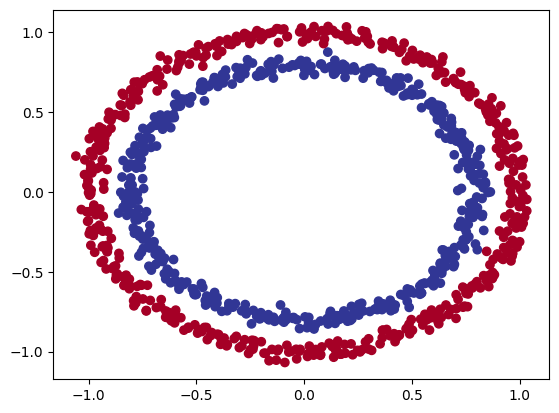

In [ ]:
# Check out our data:
plt.scatter(X[:, 0], X[:, 1], c = y, cmap = plt.cm.RdYlBu);

313/313 [==============================] - 0s 1ms/step
doing binary classifcation...


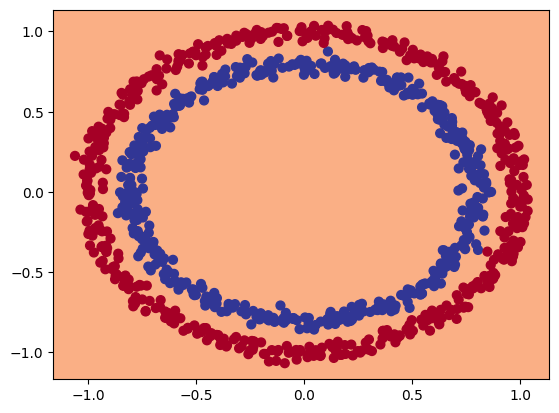

In [ ]:
# Check the decision boundary for our latest model:
plot_decision_boundary(model = model_4, 
                       X = X, 
                       y = y)

In [ ]:
# Building our neural network with non-linear activation function:

# Set random seed
tf.random.set_seed(42)

# Create model:
model_5 = tf.keras.Sequential([
    tf.keras.layers.Dense(8, activation = tf.keras.activations.relu), 
    tf.keras.layers.Dense(6, activation = 'relu'), 
    tf.keras.layers.Dense(1)
  
])

# Compile model:
model_5.compile(loss = tf.keras.losses.BinaryCrossentropy(), 
                optimizer = tf.keras.optimizers.Adam(lr = 0.03), 
                metrics = ['accuracy'])

# Fit the model:
history = model_5.fit(expand_dims(X, axis = 1), y, epochs = 200)

Epoch 1/200
32/32 [==============================] - 1s 2ms/step - loss: 0.7247 - accuracy: 0.4897
Epoch 2/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7104 - accuracy: 0.4884
Epoch 3/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7074 - accuracy: 0.4859
Epoch 4/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7041 - accuracy: 0.4924
Epoch 5/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7039 - accuracy: 0.4904
Epoch 6/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7029 - accuracy: 0.4921
Epoch 7/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7027 - accuracy: 0.4924
Epoch 8/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7016 - accuracy: 0.4911
Epoch 9/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7014 - accuracy: 0.4893
Epoch 10/200
32/32 [==============================] - 0s 2ms/step - loss: 0.7000 - accuracy: 0.4943
Epoch 11/

In [ ]:
from tensorflow.keras import regularizers

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_5 = tf.keras.Sequential([
    tf.keras.layers.Dense(3, activation='relu'),
    tf.keras.layers.Dense(2)
])

# Compile model:
model_5.compile(loss = tf.keras.losses.binary_crossentropy,
                optimizer = tf.keras.optimizers.Adam(lr=0.001),
                metrics=['accuracy'])

# Fit model:
history = model_5.fit(X, y, epochs=100, verbose=0)


In [ ]:
# Time to replicate the multi-layer neural network from TensorFlow playground in code:

# Set random seed
tf.random.set_seed(42)

# Create a model
model_6 = tf.keras.Sequential([
  tf.keras.layers.Dense(4, activation=tf.keras.activations.relu), # hidden layer 1. Contains: 4 neurons, ReLU activation
  tf.keras.layers.Dense(4, activation=tf.keras.activations.relu), # hidden layer 2. Contains: 4 neurons, ReLU activation
  tf.keras.layers.Dense(1) # ouput layer (we want the output to be only one)
])

# Compile the model
model_6.compile(loss=tf.keras.losses.binary_crossentropy,
                optimizer=tf.keras.optimizers.Adam(lr=0.03), # Adam's default learning rate is 0.001
                metrics=['accuracy'])

# Fit the model
history = model_6.fit(X, y, epochs=300)
     

Epoch 1/300
32/32 [==============================] - 1s 2ms/step - loss: 3.1666 - accuracy: 0.4820
Epoch 2/300
32/32 [==============================] - 0s 2ms/step - loss: 1.3298 - accuracy: 0.4790
Epoch 3/300
32/32 [==============================] - 0s 2ms/step - loss: 1.1883 - accuracy: 0.4860
Epoch 4/300
32/32 [==============================] - 0s 2ms/step - loss: 1.1146 - accuracy: 0.4890
Epoch 5/300
32/32 [==============================] - 0s 2ms/step - loss: 1.0566 - accuracy: 0.4870
Epoch 6/300
32/32 [==============================] - 0s 2ms/step - loss: 1.0052 - accuracy: 0.4810
Epoch 7/300
32/32 [==============================] - 0s 2ms/step - loss: 0.9596 - accuracy: 0.4630
Epoch 8/300
32/32 [==============================] - 0s 2ms/step - loss: 0.9179 - accuracy: 0.4550
Epoch 9/300
32/32 [==============================] - 0s 2ms/step - loss: 0.8835 - accuracy: 0.4610
Epoch 10/300
32/32 [==============================] - 0s 2ms/step - loss: 0.8544 - accuracy: 0.4610
Epoch 11/

In [ ]:
# Evaluate model:
model_6.evaluate(X, y)

32/32 [==============================] - 0s 2ms/step - loss: 0.0362 - accuracy: 0.9850


[0.03620283305644989, 0.9850000143051147]

313/313 [==============================] - 0s 1ms/step
doing binary classifcation...


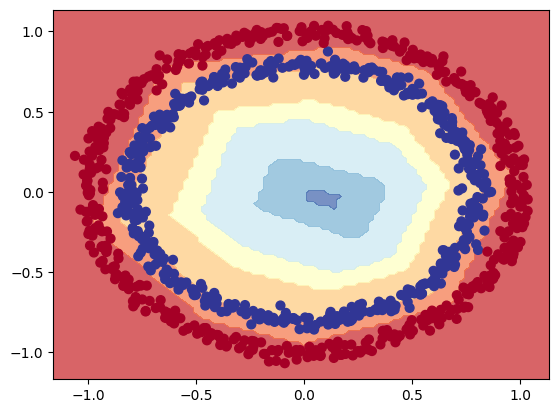

In [ ]:
# Visualize model's predictions:
plot_decision_boundary(model_6, X, y)

In [ ]:
# y = tf.convert_to_tensor(y)
# X = tf.convert_to_tensor(X)

In [ ]:
# Set random seed:
tf.random.set_seed(42)

# Create model:
model_7 = tf.keras.Sequential([
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Compile model:
model_7.compile(loss = tf.keras.losses.binary_crossentropy,
                optimizer = tf.keras.optimizers.Adam(), 
                metrics = ['accuracy'] 
                )

# Fit model:
# history = model_7.fit(tf.expand_dims(X, axis=-1), y, epochs=100, verbose=0)
history = model_7.fit(X, y, epochs=250, verbose = 0) # Only 250 epochs (so it takes less time to train)
# history = model_7.fit(X, y, epochs=2000, verbose = 0) ### Epochs 2000

In [ ]:
model_7.evaluate(X, y)

32/32 [==============================] - 0s 1ms/step - loss: 0.0774 - accuracy: 0.9800


[0.07744651287794113, 0.9800000190734863]

313/313 [==============================] - 1s 2ms/step
doing binary classifcation...


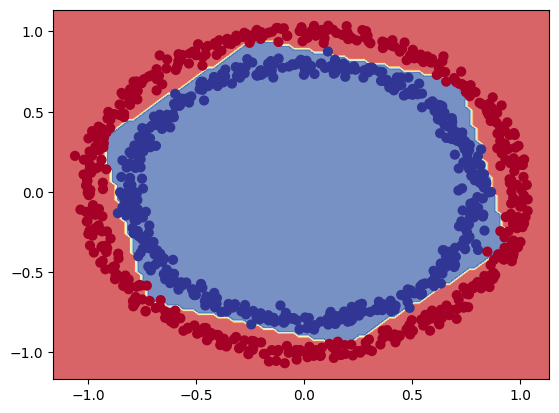

In [ ]:
plot_decision_boundary(model_7, X, y)

**Takeaway:** The combination of **linear (straigth lines) and non-linear (non-straight lines) functions** is one of the key fundamentals of neural networks. 

In [ ]:
# Creaing a toy tensor (similar to the data we pass into our models)
A = tf.cast(tf.range(-10, 10), tf.float32)
A

<tf.Tensor: shape=(20,), dtype=float32, numpy=
array([-10.,  -9.,  -8.,  -7.,  -6.,  -5.,  -4.,  -3.,  -2.,  -1.,   0.,
         1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.],
      dtype=float32)>

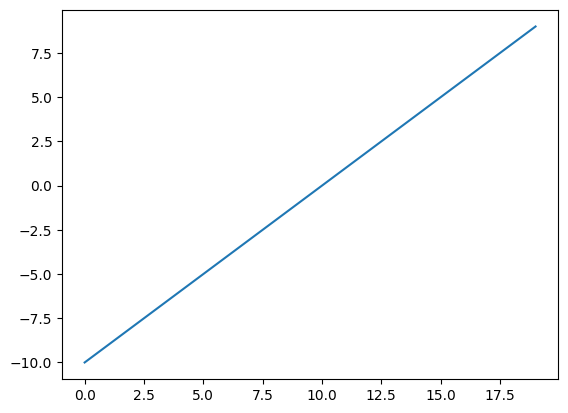

In [ ]:
# Visualize toy tensor:
plt.plot(A);

In [ ]:
# Let's start by replicating sigmoid: sigmoid(x) = 1 / (1 + exp(-x))
def sigmoid(x):
  return 1 / (1 + tf.exp(-x)) 

# Use the sigmoid function on our toy tensor:
sigmoid_A = sigmoid(A)
sigmoid(A)

<tf.Tensor: shape=(20,), dtype=float32, numpy=
array([4.5397872e-05, 1.2339458e-04, 3.3535014e-04, 9.1105117e-04,
       2.4726233e-03, 6.6928510e-03, 1.7986210e-02, 4.7425874e-02,
       1.1920292e-01, 2.6894143e-01, 5.0000000e-01, 7.3105860e-01,
       8.8079703e-01, 9.5257413e-01, 9.8201376e-01, 9.9330717e-01,
       9.9752742e-01, 9.9908900e-01, 9.9966466e-01, 9.9987662e-01],
      dtype=float32)>

# As seen in the graph below, the sigmoid activation function transformed the linear activation function into non-linear, helping us find better patterns in our model!!!


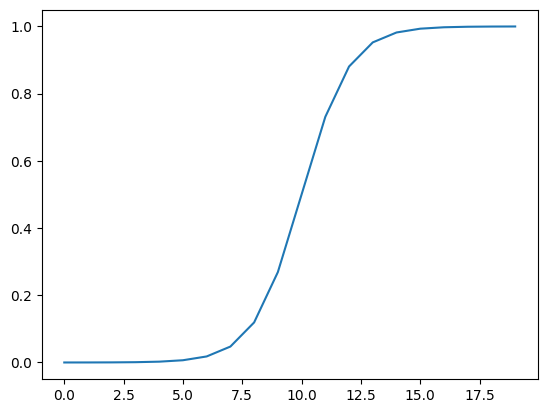

In [ ]:
# Plot our toy tensor transformed by sigmoid:
plt.plot(sigmoid_A) 

In [ ]:
# Let's recreate the relu function:
def relu(x):
  return tf.maximum(0, x) 

# Passing our toy tensor into our custom function:
relu_A = relu(A) 
relu(A) 

<tf.Tensor: shape=(20,), dtype=float32, numpy=
array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 2., 3., 4., 5., 6.,
       7., 8., 9.], dtype=float32)>

In [ ]:
A

<tf.Tensor: shape=(20,), dtype=float32, numpy=
array([-10.,  -9.,  -8.,  -7.,  -6.,  -5.,  -4.,  -3.,  -2.,  -1.,   0.,
         1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.],
      dtype=float32)>

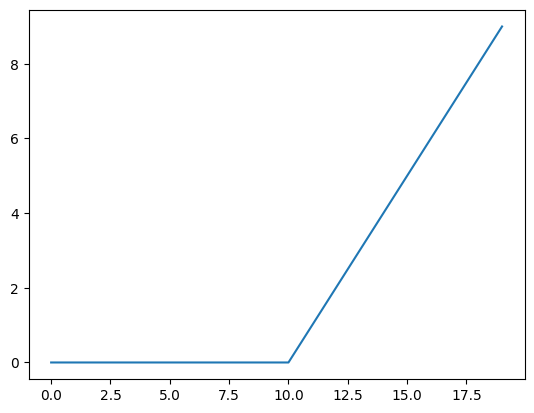

In [ ]:
plt.plot(relu_A)

In [ ]:
# Let's try the linear activation function:
def linear(x):
  return tf.keras.activations.linear(x)

linear_A = linear(A)
linear(A)

<tf.Tensor: shape=(20,), dtype=float32, numpy=
array([-10.,  -9.,  -8.,  -7.,  -6.,  -5.,  -4.,  -3.,  -2.,  -1.,   0.,
         1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.],
      dtype=float32)>

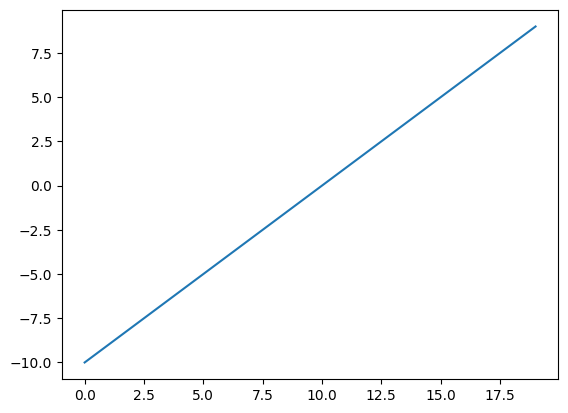

In [ ]:
### The linear activation function doesn't change anything. 
plt.plot(linear_A)

In [ ]:
# It's all the same! 
A == linear_A

<tf.Tensor: shape=(20,), dtype=bool, numpy=
array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])>

# Evaluating and improving our classification model

So far we've been training and testing on the same dataset...
However, in machine learning this is basically a sin.
So let's create a training and test set.

In [ ]:
#  Check how many examples we have. (checking the length of our dataset)
len(X)

1000

In [ ]:
### It can be done in 2 different ways: using scikit-learn train-test split OR by indexing:

# OPTION 1: INDEXING: Split into train and test sets:
X_train, y_train = X[:800], y[:800]
X_test, y_test = X[800:], y[800:]

X_train.shape, X_test.shape, y_train.shape, y_test.shape

# OPTION 2: train-test-split: 

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

((800, 2), (200, 2), (800,), (200,))

In [ ]:
from keras.optimizers import Adam

# Recreating a model to fit on the training data and evaluate on the testing data:

# Set random seed:
tf.random.set_seed(42)

# 1. Create the model (same as model_7)
model_8 = tf.keras.Sequential([
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# 2. Compile the model
model_8.compile(loss = tf.keras.losses.binary_crossentropy, # Watch out with binary_crossentropy!!! IT'S ALL LOW LOWER-CASE (binary_crossentropy)
                optimizer = tf.keras.optimizers.Adam(learning_rate = 0.01), 
                metrics = ['accuracy'])

# 3. Fit the model
history = model_8.fit(X_train, y_train, epochs = 25)
# history = model_5.fit(expand_dims(X, axis = 1), y, epochs = 200)

Epoch 1/25
25/25 [==============================] - 1s 2ms/step - loss: 0.6966 - accuracy: 0.4563
Epoch 2/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6917 - accuracy: 0.4600
Epoch 3/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6889 - accuracy: 0.5063
Epoch 4/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6858 - accuracy: 0.5225
Epoch 5/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.5387
Epoch 6/25
25/25 [==============================] - 0s 3ms/step - loss: 0.6778 - accuracy: 0.5238
Epoch 7/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6712 - accuracy: 0.5775
Epoch 8/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6526 - accuracy: 0.5975
Epoch 9/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6348 - accuracy: 0.6263
Epoch 10/25
25/25 [==============================] - 0s 2ms/step - loss: 0.6240 - accuracy: 0.6538
Epoch 11/25
25/25 [

In [ ]:
# 4. Evaluate the model on the test set:
model_8.evaluate(X_test, y_test)

7/7 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8750


[0.3608766496181488, 0.875]

313/313 [==============================] - 0s 1ms/step
doing binary classifcation...
313/313 [==============================] - 0s 1ms/step
doing binary classifcation...


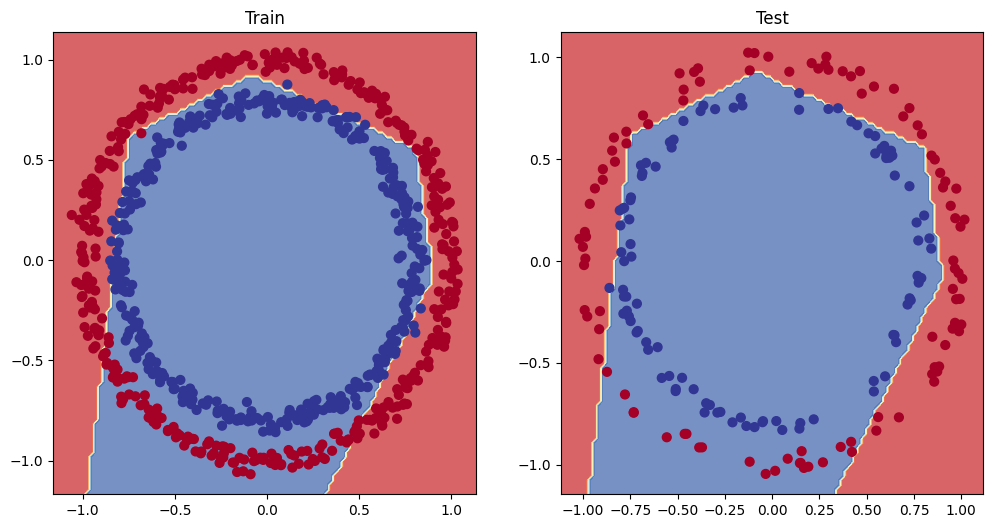

In [ ]:
# Plot the decision boundaries for the training and test sets
plt.figure(figsize = (12, 6))

plt.subplot(1, 2, 1) # Here we're saying we wawnt to have 1 row, 2 columns, and the first value
plt.title('Train')
plot_decision_boundary(model_8, 
                       X = X_train, 
                       y = y_train)
plt.subplot(1, 2, 2)
plt.title('Test')
plot_decision_boundary(model_8, 
                       X = X_test, 
                       y = y_test)
plt.show();

In [ ]:
model_7.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 4)                 12        
                                                                 
 dense_19 (Dense)            (None, 4)                 20        
                                                                 
 dense_20 (Dense)            (None, 1)                 5         
                                                                 
Total params: 37
Trainable params: 37
Non-trainable params: 0
_________________________________________________________________


# PLot the loss (or training) curves

In [ ]:
# Convert the history object into a DataFrame:
pd.DataFrame(history.history)

,loss,accuracy
0,0.696592,0.45625
1,0.691709,0.46000
2,0.688903,0.50625
3,0.685806,0.52250
4,0.682777,0.53875
5,0.677837,0.52375
6,0.671168,0.57750
7,0.652629,0.59750
8,0.634799,0.62625
9,0.624020,0.65375


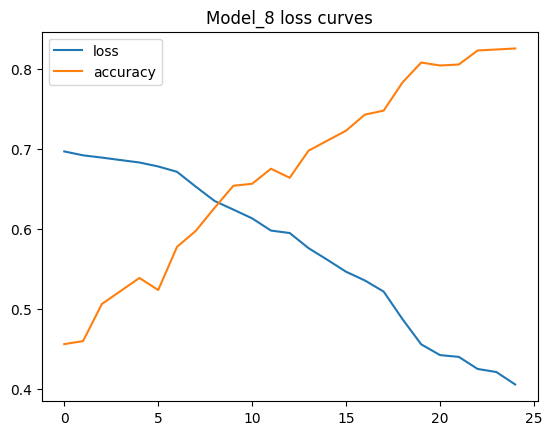

In [ ]:
# Plot the loss curves
pd.DataFrame(history.history).plot()
plt.title('Model_8 loss curves') ;

**NOTE:** For many problems, the loss function going down means that the model is improving (the predictions it's making are getting closer to the ground truth labels)

## Finding the best learning rate

To find the ideal learning rate (the learning rate where the loss decreases the most during training) we're going to used the following steps:
* A learning rate **callback** - we can think of callback as an extra pice of functionality, we can add to our model *while* it's training.
* Another model (we could use the same one as above, but we're practicing to build models, therefore it's best to create a new one).
* A modified loss curves plot. 

In [ ]:
# Set random seed:
tf.random.set_seed(42)

# Create model:
model_9 = tf.keras.Sequential([
  tf.keras.layers.Dense(4, activation = "relu"),
  tf.keras.layers.Dense(4, activation = "relu"),
  tf.keras.layers.Dense(1, activation = "sigmoid")
])

# Comiling model:
model_9.compile(loss="binary_crossentropy", 
              optimizer = "Adam", 
              metrics = ["accuracy"]) 

# Creating a learning rate callback:
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch/20))

# Fit the model (passing lr_scheduler callback):
history_9 = model_9.fit(X_train, 
                      y_train, 
                      epochs=100,
                      callbacks=[lr_scheduler])
     

Epoch 1/100
25/25 [==============================] - 1s 2ms/step - loss: 0.6938 - accuracy: 0.4888 - lr: 1.0000e-04
Epoch 2/100
25/25 [==============================] - 0s 2ms/step - loss: 0.6937 - accuracy: 0.4863 - lr: 1.1220e-04
Epoch 3/100
25/25 [==============================] - 0s 2ms/step - loss: 0.6936 - accuracy: 0.4913 - lr: 1.2589e-04
Epoch 4/100
25/25 [==============================] - 0s 2ms/step - loss: 0.6934 - accuracy: 0.4863 - lr: 1.4125e-04
Epoch 5/100
25/25 [==============================] - 0s 2ms/step - loss: 0.6933 - accuracy: 0.4900 - lr: 1.5849e-04
Epoch 6/100
25/25 [==============================] - 0s 2ms/step - loss: 0.6932 - accuracy: 0.4888 - lr: 1.7783e-04
Epoch 7/100
25/25 [==============================] - 0s 2ms/step - loss: 0.6930 - accuracy: 0.4963 - lr: 1.9953e-04
Epoch 8/100
25/25 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.4925 - lr: 2.2387e-04
Epoch 9/100
25/25 [==============================] - 0s 2ms/step - loss:

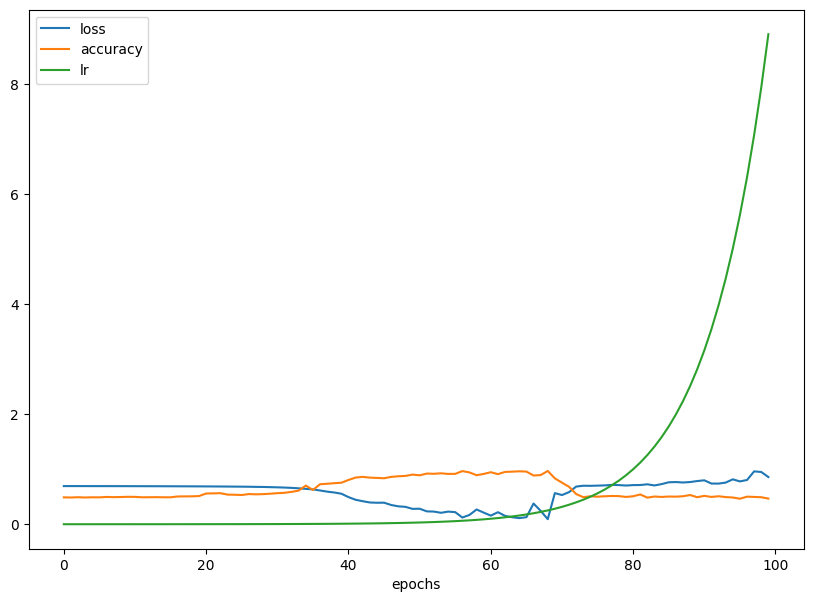

In [ ]:
# Check out the history
pd.DataFrame(history_9.history).plot(figsize = (10, 7), xlabel = 'epochs');

Text(0.5, 1.0, 'Learning Rate V.S. Loss')

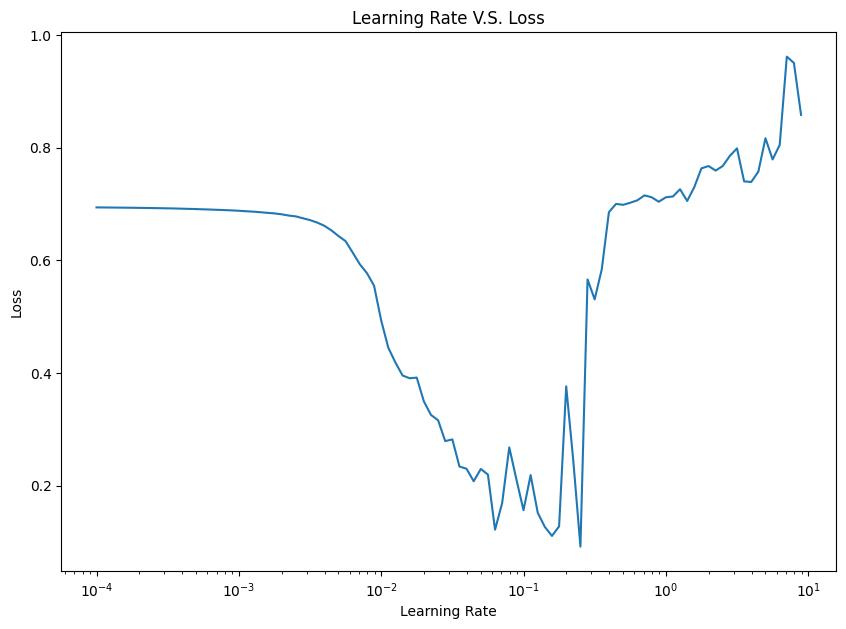

In [ ]:
# Plot the learning rate V.S. the loss:
lrs = 1e-4 * (10 ** (tf.range(100)/20))
plt.figure(figsize = (10, 7))
plt.semilogx(lrs, history_9.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss')
plt.title('Learning Rate V.S. Loss')

In [ ]:
# Example of other typical learning rate values:
10 **0, 10**-1, 10**-2, 10**-3, 10**-4

(1, 0.1, 0.01, 0.001, 0.0001)

In [ ]:
# Learning Rate used before (model_8):
10**-2

0.01

In [ ]:
# Applying a higher *higher* learning rate (lr) to the same model. Based onn the learning rates seen in the above graph
# Creating a new model with a better lr:

# Set random seed:
tf.random.set_seed(42)

# Create model_10:
model_10 = tf.keras.Sequential([
  tf.keras.layers.Dense(4, activation = "relu"),
  tf.keras.layers.Dense(4, activation = "relu"),
  tf.keras.layers.Dense(1, activation = "sigmoid")
])


# Compile model:
model_10.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(lr = 0.3), 
                metrics=["accuracy"])


# # Create a learninf rate callback: NOT NEEDED NOW, SINCE WE USED IT BEFORE TO FIND THE IDEAL LEARFNING RATE
# lr_scheduler_2 = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch/20))

# Fit the model for 20 epochs (5 less than before):
history_10 = model_10.fit(X_train, y_train, epochs = 20)


Epoch 1/20
25/25 [==============================] - 1s 2ms/step - loss: 0.7276 - accuracy: 0.5038
Epoch 2/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7191 - accuracy: 0.4988
Epoch 3/20
25/25 [==============================] - 0s 3ms/step - loss: 0.7135 - accuracy: 0.4888
Epoch 4/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7096 - accuracy: 0.4787
Epoch 5/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7071 - accuracy: 0.4775
Epoch 6/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7051 - accuracy: 0.4725
Epoch 7/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7032 - accuracy: 0.4638
Epoch 8/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7019 - accuracy: 0.4363
Epoch 9/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7010 - accuracy: 0.4137
Epoch 10/20
25/25 [==============================] - 0s 2ms/step - loss: 0.7004 - accuracy: 0.3850
Epoch 11/20
25/25 [

In [ ]:
model_10.evaluate(X_test, y_test)

7/7 [==============================] - 0s 2ms/step - loss: 0.6938 - accuracy: 0.5050


[0.6937757730484009, 0.5049999952316284]

In [ ]:
model_9.evaluate(X_test, y_test)

7/7 [==============================] - 0s 2ms/step - loss: 0.6934 - accuracy: 0.4950


[0.6934358477592468, 0.4950000047683716]

In [ ]:
model_8.evaluate(X_test, y_test)

7/7 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8750


[0.3608766496181488, 0.875]

In [ ]:
### Training the model for longer (100 epochs) AND then re-training it for 20 epochs ### 
# THEN WE GET AN ALMOST PERFECT ACCURACY AND LOSS SCORES, BUT IT IS BECAUSE IT'S ALREADY BEEN TRAINED FOR LONGER!

history_10 = model_10.fit(X_train, y_train, epochs = 200, verbose=0)

model_10.evaluate(X_test, y_test)

7/7 [==============================] - 0s 4ms/step - loss: 0.5669 - accuracy: 0.7000


[0.5668902397155762, 0.699999988079071]

313/313 [==============================] - 1s 2ms/step
doing binary classifcation...
313/313 [==============================] - 1s 2ms/step
doing binary classifcation...


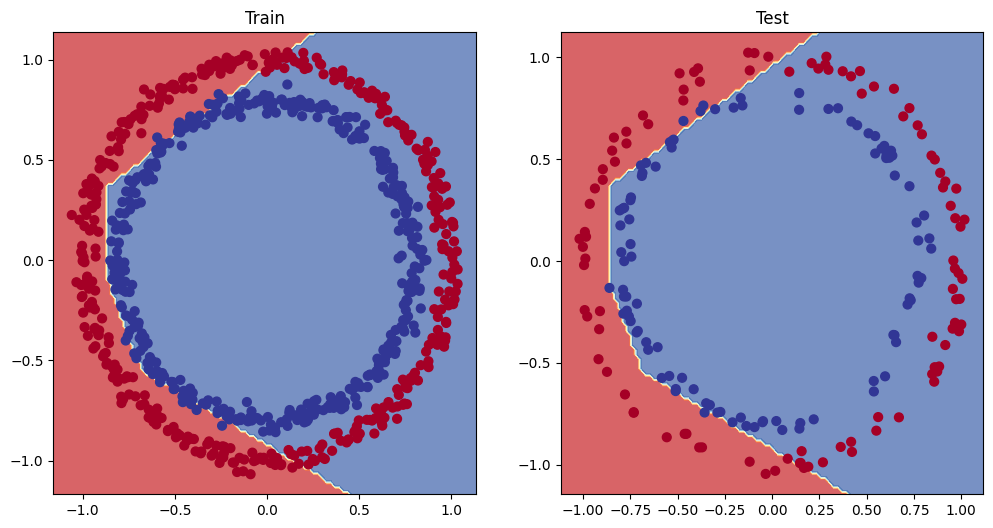

In [ ]:
# Plot the decision boundaries for the training and test sets:
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
plt.title("Train")
plot_decision_boundary(model_10, X = X_train, y = y_train)
plt.subplot(1, 2, 2)
plt.title("Test")
plot_decision_boundary(model_10, X = X_test, y = y_test)
plt.show()
     

# More classification evaluation methods:

Alongside visualizing our models results as much as possible, there are and handful of other classification methods and metrics to be familiar with!

* Accuracy
* Precision
* Recall
* F1-score
* Confusion Matrix
* Classification report (from scikit-learn)

In [ ]:
# Check the accuracy of our model
loss, accuracy = model_10.evaluate(X_test, y_test)
print(f"Model loss on the Test set: {loss}")
print(f"Model accuracy on the Test set: {(accuracy*100) : .2f}%")

7/7 [==============================] - 0s 2ms/step - loss: 0.5669 - accuracy: 0.7000
Model loss on the Test set: 0.5668902397155762
Model accuracy on the Test set:  70.00%


# Confusion Martix

In [ ]:
# Create a confusion matrix:
from sklearn.metrics import confusion_matrix

# Make predictions:
y_preds = model_10.predict(X_test)

# Create confusion matrix:
# confusion_matrix(y_test, y_preds) ########### y_test and y_preds are not in the dame form, y_test has binary data, but y_preds hasn't, so we need to round y_preds to get binary! 


7/7 [==============================] - 0s 2ms/step


In [ ]:
y_test[:10]

array([1, 1, 1, 1, 0, 0, 1, 0, 1, 0])

In [ ]:
 y_preds[:10]

array([[0.6383324 ],
       [0.6383324 ],
       [0.6383324 ],
       [0.6383324 ],
       [0.6383324 ],
       [0.15170264],
       [0.55593276],
       [0.06598414],
       [0.6383324 ],
       [0.6383324 ]], dtype=float32)

Our predictions array has come out in **prediction probability** form... the standard output from the sigmoid (or softmax) activation functions.

In [ ]:
# Convert our prediction probabilities to binary format and view the first 10
tf.round(y_preds)[:10]

<tf.Tensor: shape=(10, 1), dtype=float32, numpy=
array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [1.]], dtype=float32)>

In [ ]:
# Create a confusion matrix:
confusion_matrix(y_test, tf.round(y_preds))

array([[46, 55],
       [ 5, 94]])

Plotting the confusion matrix


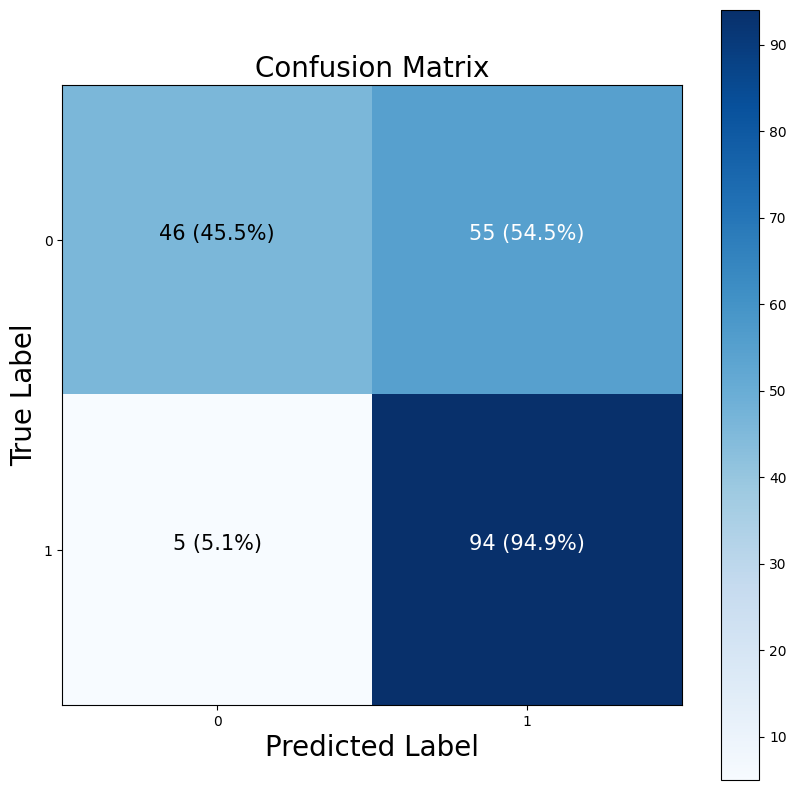

In [ ]:
# plot_confusion_matrix function - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html
# and Made with ML's introductory notebook - https://github.com/GokuMohandas/MadeWithML/blob/main/notebooks/08_Neural_Networks.ipynb 

import itertools

figsize = (10, 10)

# Create the confusion matrix
cm = confusion_matrix(y_test, tf.round(y_preds))
cm_norm = cm.astype("float") / cm.sum(axis = 1) [:, np.newaxis] # normalize our confusion matrix
n_classes = cm.shape[0]

# Let's prettyfy it (plot it)
fig, ax = plt.subplots(figsize = figsize)

# Create a matrix plot
cax = ax.matshow(cm, cmap = plt.cm.Blues)
fig.colorbar(cax)

# Create classes
classes = False

if classes :
  label = classes
else :
  labels = np.arange(cm.shape[0])
 # Lets label the axis
ax.set(title = 'Confusion Matrix', 
       xlabel = 'Predicted Label', 
       ylabel = 'True Label', 
       xticks = np.arange(n_classes), 
       yticks = np.arange(n_classes), 
       xticklabels = labels, 
       yticklabels = labels)

# Set x-axis labels to the bottom
ax.xaxis.set_label_position("bottom")
ax.xaxis.tick_bottom()

# Adjust label size
ax.yaxis.label.set_size(20)
ax.xaxis.label.set_size(20)
ax.title.set_size(20)

 # Set threshold for different colors
threshold = (cm.max() + cm.min()) / 2.

# Plot the text on each cell
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)", 
           horizontalalignment = "center", 
           color = 'white' if cm[i, j] > threshold else 'black', 
           size = 15)

# Working with a larger example (multiclass calssification)

When we have more than 2 classes as an option, it's known as **multi-class classification**.

  * This means that if we have 3 differnt classes, it's multi-class calssification.
  * But, if we have 100 different classes it's ALSO multi-class calssification! 

To practice multi-class calssification we're going to build a neural network to classify images of different kind of clothing. 

In [ ]:
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist # Importing dataset

# The data has already been sorted into training and test sets for us
(train_data, train_labels), (test_data, test_labels) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [ ]:
# Show the first training example
print(f"Training sample: \n {train_data[0]} \n")
print(f"Training label: \n {train_labels[0]} \n")

Training sample: 
 [[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   1   0   0  13  73   0
    0   1   4   0   0   0   0   1   1   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3   0  36 136 127  62
   54   0   0   0   1   3   4   0   0   3]
 [  0   0   0   0   0   0   0   0   0   0   0   0   6   0 102 204 176 134
  144 123  23   0   0   0   0  12  10   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0 155 236 207 178
  107 156 161 109  64  23  77 130  72  15]
 [  0   0   0   0   0   0   0   0   0   0   0   1   0  69 207 223 218 216
  216 163 127 121 122 146 141  88 172  66]
 [  0   0   0   0   0   0   0   0   0   1   1

In [ ]:
# Count the total amount of indexes available using .shape()

len(train_data)

60000

In [ ]:
# Checking shape of a train_data:
train_data[0].shape, train_labels[0].shape 

((28, 28), ())

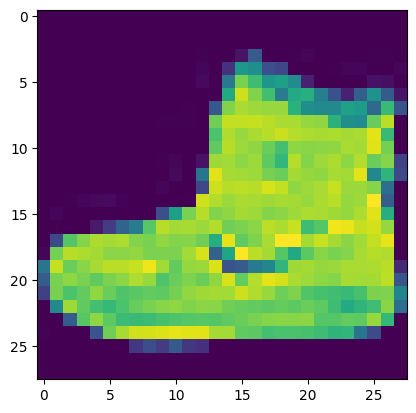

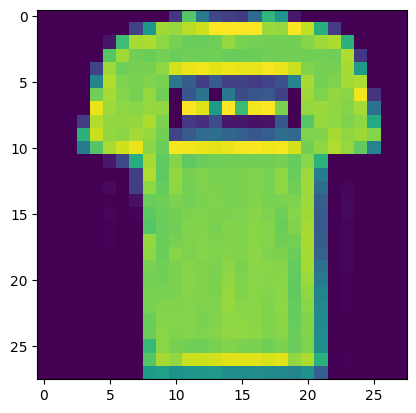

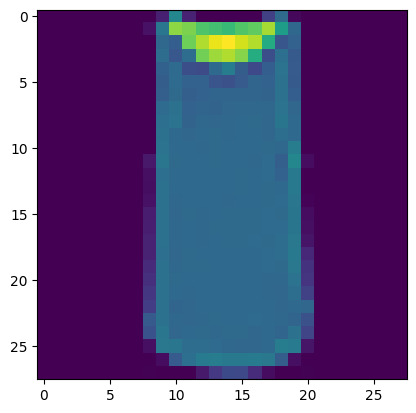

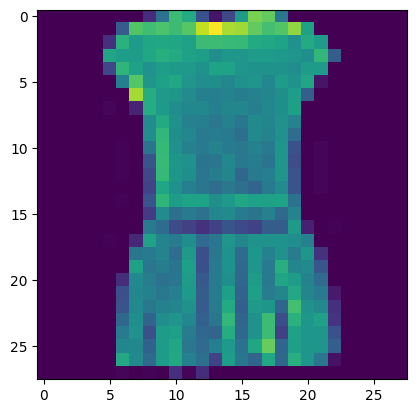

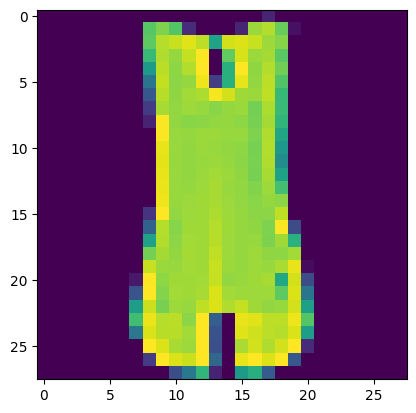

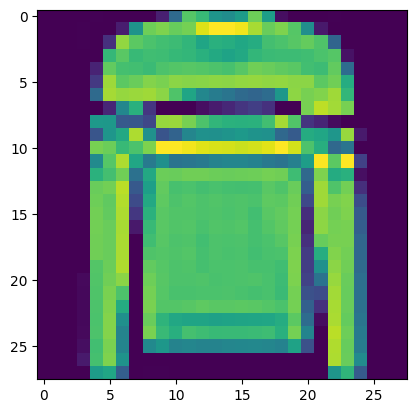

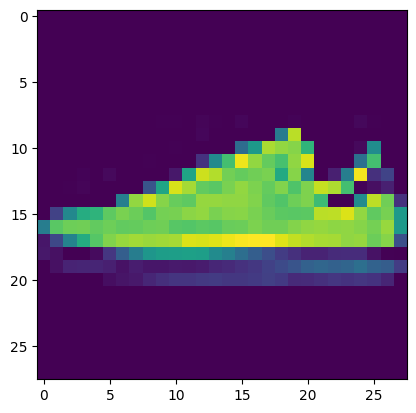

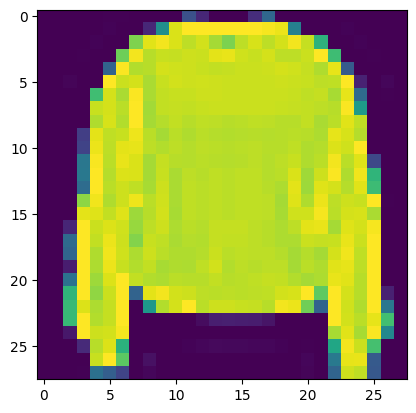

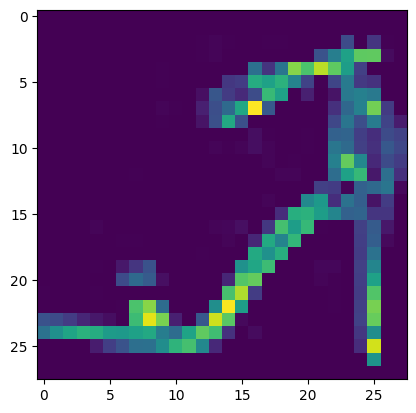

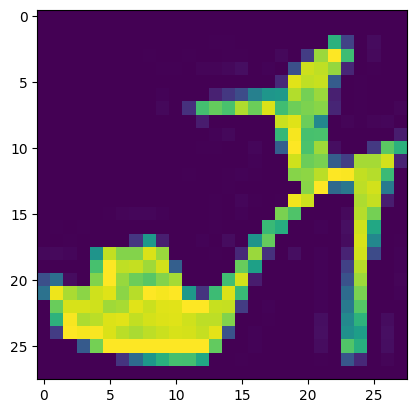

In [ ]:
# Plot a single sample
import matplotlib.pyplot as plt


plt.imshow(train_data[0]) 
plt.show()

plt.imshow(train_data[1]) 
plt.show()

plt.imshow(train_data[2]) 
plt.show()

plt.imshow(train_data[3]) 
plt.show()

plt.imshow(train_data[4]) 
plt.show()

plt.imshow(train_data[5]) 
plt.show()

plt.imshow(train_data[6]) 
plt.show()

plt.imshow(train_data[7]) 
plt.show()

plt.imshow(train_data[8]) 
plt.show()

plt.imshow(train_data[9]) 
plt.show()


In [ ]:
train_labels[7]

2

In [ ]:
# Create a small list so we can index into our training labels so they're human-readable
class_names = ["T-shirt/top", 
               "Trouser", 
               "Pullover", 
               "Dress", 
               "Coat", 
               "Sandal", 
               "Shirt", 
               "Sneaker", 
               "Bag", 
               "Ankle boot"]
# Countinng number of classes in the list
len(class_names)

10

Text(0.5, 1.0, 'T-shirt/top')

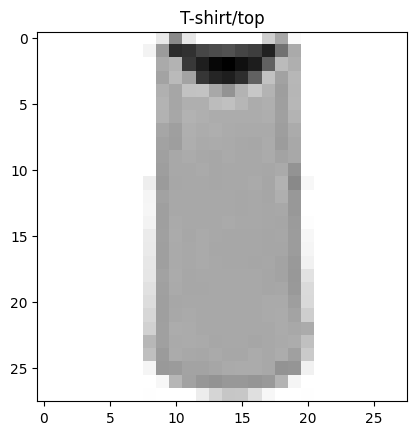

In [ ]:
# Plot an example image and its label
index_of_choice = 2 # You can input any number you want here

plt.imshow(train_data[index_of_choice], cmap = plt.cm.binary)
plt.title(class_names[train_labels[index_of_choice]])

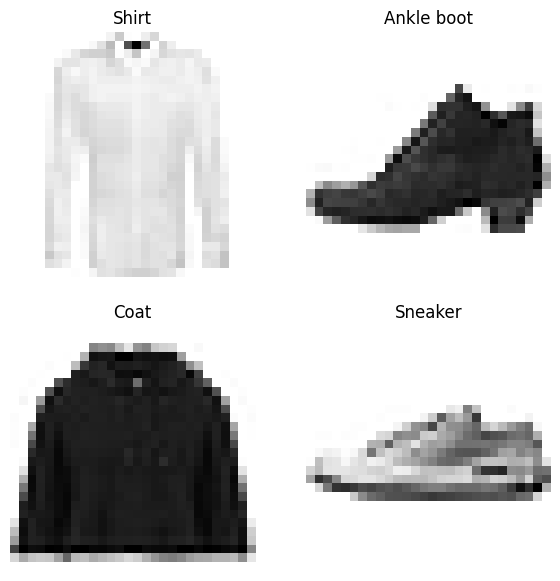

In [ ]:
# Plot multiple random images of fashion MNIST
import random

plt.figure(figsize = (7, 7))
for i in range(4):  # Setting it at range 4, just to have a number, but since it's random, we get different images every time in this range, 4. 
  ax = plt.subplot(2, 2, i + 1)                            # Here we set the index at i+1 
  rand_index = random.choice(range(len(train_data)))       # The ranges is set to the whole dataset, since we passed len(train_data), which gives us the length of the train df
  plt.imshow(train_data[rand_index], cmap = plt.cm.binary) # Showing the images
  plt.title(class_names[train_labels[rand_index]])         # Giving each picture a title based on their corresponding train_labels
  plt.axis(False)                                          # Setting it to False, so we can remove axis lines, tick marks and labels from the plot. (Cleaner/Easier to understand)


Multi-class classification 

# Building a multi-class classification model:

For our multi-class classification model, we are able to use a similar architecture to our binary classifiers, however, we're going to have to tweak a few things:

* Input shape = In this case is: 28 x 28 (the size of the image)
* Output shape = In this case is: 10. Therefore we want one output per class of coding.
* Loss function = tf.kearas.losses.CategoricalCrossentropy()
  * If our labels are one-hot encoded, we use CategoricalCrossentropy()
  * If our labels are in integer form, we use SparseCategoricalCrossentropy() 
* Output layer activation = Softmax (not sigmoid)

In [ ]:
# Checking the shape of the train_data dataset
train_data[0].shape

(28, 28)

In [ ]:
# Checking the number of class_names
len(class_names)

10

In [ ]:
# Our data needs to be flattened (from 28 x 28 TO None, 784)

# flatten_model = tf.keras.Sequential([tf.keras.layers.Flatten(input_shape = (28, 28))])
# flatten_model.output_shape

In [ ]:
# The 784 above comes from:
28*28 # The shapeof train_data

784

In [ ]:
# Set random seed:
tf.random.set_seed(42)

# Create model:
model_11 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)),
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax') # We need 10 neurons, because the output needs to be 10, since this is the length of 'class_names'
])

# Compile model:
model_11.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(),
                 metrics = ['accuracy'])

# Fit the model:
non_norm_history = model_11.fit(train_data, 
                                train_labels, 
                                epochs = 10, 
                                validation_data = (test_data, test_labels)) # While we're fitting the model, this validates how good/bad our trained data is performing compared to our unseen data (test data)



Epoch 1/10
1875/1875 [==============================] - 5s 2ms/step - loss: 2.3818 - accuracy: 0.1904 - val_loss: 1.7848 - val_accuracy: 0.2359
Epoch 2/10
1875/1875 [==============================] - 4s 2ms/step - loss: 1.7096 - accuracy: 0.2755 - val_loss: 1.5916 - val_accuracy: 0.3486
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 1.4218 - accuracy: 0.4208 - val_loss: 1.3871 - val_accuracy: 0.4367
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 1.2863 - accuracy: 0.4693 - val_loss: 1.2186 - val_accuracy: 0.5077
Epoch 5/10
1875/1875 [==============================] - 5s 3ms/step - loss: 1.1787 - accuracy: 0.5162 - val_loss: 1.1983 - val_accuracy: 0.5022
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 1.1382 - accuracy: 0.5322 - val_loss: 1.1334 - val_accuracy: 0.5405
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 1.1189 - accuracy: 0.5365 - val_loss: 1.1321 - val_accuracy:

In [ ]:
# Checking the model summary:
model_11.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense_30 (Dense)            (None, 4)                 3140      
                                                                 
 dense_31 (Dense)            (None, 4)                 20        
                                                                 
 dense_32 (Dense)            (None, 10)                50        
                                                                 
Total params: 3,210
Trainable params: 3,210
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Checking min and max values of the training data:
train_data.min(), train_data.max()

(0, 255)

Neural Networks prefer data to be scaled (or normalized). This means they like to have numbers between 0 and 1, in the tensors they're trying to find patterns in.

In [ ]:
### We can get our training and testing data between 0 and 1, by dividing by the maximum

# train_data_norm = train_data / 255.0
# test_data_norm = test_data / 255.0

train_data = tf.keras.utils.normalize(train_data, axis = 1)
test_data = tf.keras.utils.normalize(test_data, axis = 1)

# Check the min and max values of the scaled training data
train_data.min(), train_data.max()

(0.0, 1.0)

In [ ]:
train_data.shape

(60000, 28, 28)

In [ ]:
# Since now our data has been normalized, let's build a model to find patterns in it, and hopefully improve its performance!

# Set random seed:
tf.random.set_seed(42)

# Build a model:
model_12 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)),
    tf.keras.layers.Dense(4, activation = 'relu'),
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax') # We need 10 neurons in the output layer, because we have 10 different classes # We need softmax, because we're dealing with a multi-class classification problem
])

# Compile model:
model_12.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(), 
                 metrics = ['accuracy'])

# Fit the model:
norm_history = model_12.fit(train_data, train_labels, 
                            epochs = 10, 
                            validation_data = (test_data, test_labels))

Epoch 1/10
1875/1875 [==============================] - 5s 2ms/step - loss: 1.1027 - accuracy: 0.5757 - val_loss: 0.8348 - val_accuracy: 0.6846
Epoch 2/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.7653 - accuracy: 0.7209 - val_loss: 0.7683 - val_accuracy: 0.7221
Epoch 3/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6955 - accuracy: 0.7499 - val_loss: 0.6944 - val_accuracy: 0.7569
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6481 - accuracy: 0.7705 - val_loss: 0.6513 - val_accuracy: 0.7726
Epoch 5/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.6068 - accuracy: 0.7862 - val_loss: 0.6174 - val_accuracy: 0.7839
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5818 - accuracy: 0.7934 - val_loss: 0.6150 - val_accuracy: 0.7788
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5643 - accuracy: 0.8009 - val_loss: 0.6050 - val_accuracy:

**NOTE:** Neural Networks prefer data in numerical form as well as scaled/normalized (numbers between 0 & 1)

<Axes: title={'center': 'Normalized data'}>

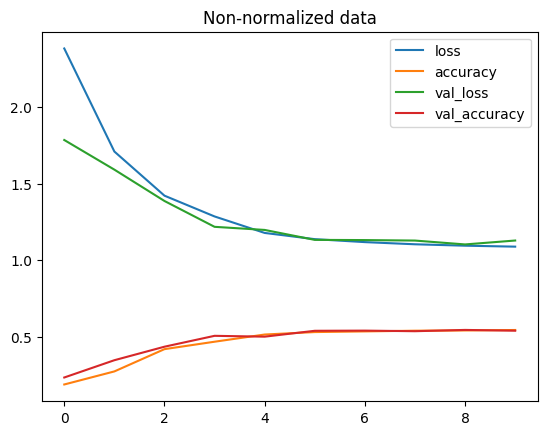

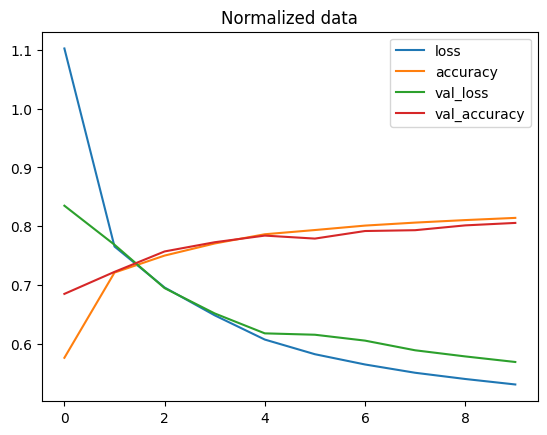

In [ ]:
import pandas as pd

# Plot non-normalized data loss curves:
pd.DataFrame(non_norm_history.history).plot(title = 'Non-normalized data')
# Plot normalized data loss curves:
pd.DataFrame(norm_history.history).plot(title = 'Normalized data')

**NOTE:** The same model with even slightly different data can produce dramatically different results. So, when we're comparing models, it's important to make sure we're comparing them on the same criteria (e.g. same architecture but different data OR same data but different architecture).

# Trying to find our neural network's ideal learning rate (lr)

In [ ]:
# Set random seed:
tf.random.set_seed(42)

# Create model:
model_13 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)),
    tf.keras.layers.Dense(4, activation = 'relu'),
    tf.keras.layers.Dense(4, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'softmax')
])

# Compile model:
model_13.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), ###
                 optimizer = tf.keras.optimizers.Adam(), 
                 metrics = ['accuracy'])

# Create learning rate callback
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-3 * 10**(epoch/20)) # This means start at this value: 1e-3 and slowly increase the learnign rate every epoch by 10**(epoch/20)

# Fit model:
find_lr_history = model_13.fit(train_data, train_labels, 
                               epochs = 40, 
                               validation_data = (test_data, test_labels), 
                               callbacks = [lr_scheduler])

Epoch 1/40
1875/1875 [==============================] - 6s 3ms/step - loss: 1.5066 - accuracy: 0.3987 - val_loss: 1.1578 - val_accuracy: 0.5722 - lr: 0.0010
Epoch 2/40
1875/1875 [==============================] - 4s 2ms/step - loss: 0.8400 - accuracy: 0.6867 - val_loss: 0.7184 - val_accuracy: 0.7268 - lr: 0.0011
Epoch 3/40
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6512 - accuracy: 0.7498 - val_loss: 0.6716 - val_accuracy: 0.7398 - lr: 0.0013
Epoch 4/40
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6174 - accuracy: 0.7674 - val_loss: 0.6426 - val_accuracy: 0.7626 - lr: 0.0014
Epoch 5/40
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5964 - accuracy: 0.7789 - val_loss: 0.6264 - val_accuracy: 0.7723 - lr: 0.0016
Epoch 6/40
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5741 - accuracy: 0.7911 - val_loss: 0.6212 - val_accuracy: 0.7804 - lr: 0.0018
Epoch 7/40
1875/1875 [==============================] - 5s

Text(0.5, 1.0, 'Finding the ideal learning rate')

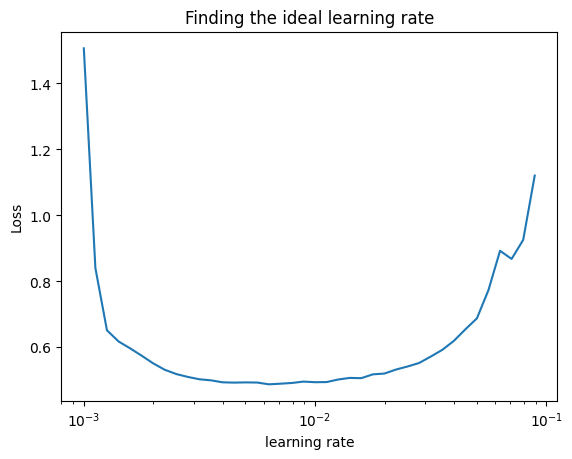

In [ ]:
# Plot learning rate decay curve:
import numpy as np
import matplotlib.pyplot as plt

lrs = 1e-3 * (10**(tf.range(40)/20))
plt.semilogx(lrs, find_lr_history.history['loss']) # We want the x-axis to be log-scale

# Making the plot pretty
plt.xlabel("learning rate")
plt.ylabel("Loss")
plt.title("Finding the ideal learning rate")

In [ ]:
10**-3

0.001

In [ ]:
# Refitting the model with the ideal learning rate

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_14 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax')
])

# Compile model:
model_14.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(lr = 0.001), 
                 metrics = ['accuracy'])

# Fitting model:
history_14 = model_14.fit(train_data, train_labels, 
                          epochs = 20, 
                          validation_data = (test_data, test_labels))

Epoch 1/20
1875/1875 [==============================] - 5s 2ms/step - loss: 1.4145 - accuracy: 0.4806 - val_loss: 1.0322 - val_accuracy: 0.6001
Epoch 2/20
1875/1875 [==============================] - 4s 2ms/step - loss: 0.9266 - accuracy: 0.6633 - val_loss: 0.8380 - val_accuracy: 0.6866
Epoch 3/20
1875/1875 [==============================] - 5s 3ms/step - loss: 0.7685 - accuracy: 0.7267 - val_loss: 0.7605 - val_accuracy: 0.7314
Epoch 4/20
1875/1875 [==============================] - 4s 2ms/step - loss: 0.7181 - accuracy: 0.7461 - val_loss: 0.7264 - val_accuracy: 0.7389
Epoch 5/20
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6868 - accuracy: 0.7562 - val_loss: 0.7005 - val_accuracy: 0.7470
Epoch 6/20
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6470 - accuracy: 0.7692 - val_loss: 0.6616 - val_accuracy: 0.7606
Epoch 7/20
1875/1875 [==============================] - 4s 2ms/step - loss: 0.6086 - accuracy: 0.7808 - val_loss: 0.6298 - val_accuracy:

from platform import architecture
# Evaluating our multi-class classification model

To evaluate our multi-class calssification model we could:
* Evaluate its performance using other classification metrics (such as confusion metrix)
* Asse some of its predictions (through visualization)
* Improve its results by training it for longer OR changing the architecture
* Save and export to use in an application 

Let's go through the top 2...

Making the previous Confusion Matrix into a function 

In [ ]:
# Note: The following confusion matrix code is a remix of Scikit-Learn's 
# plot_confusion_matrix function - https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_confusion_matrix.html
# and Made with ML's introductory notebook - https://github.com/GokuMohandas/MadeWithML/blob/main/notebooks/08_Neural_Networks.ipynb
import itertools
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
             horizontalalignment="center",
             color="white" if cm[i, j] > threshold else "black",
             size=text_size)
        

In [ ]:
# import matplotlib.pyplot as plt
# from sklearn.metrics import confusion_matrix

# def plot_confusion_matrix(y_true, y_pred, classes=None, figsize=(10,10), text_size=15):
#     # Create the confusion matrix
#     cm = confusion_matrix(y_true, y_pred)
#     cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    
#     # Create the basic figure
#     fig, ax = plt.subplots(figsize=figsize)
#     im = ax.imshow(cm_norm, interpolation="nearest", cmap=plt.cm.Blues)
#     ax.figure.colorbar(im, ax=ax)

#     # Add the annotations to the plot
#     if classes:
#         labels = classes
#     else:
#         labels = np.unique(y_true)
#     x_tick_marks = np.arange(len(labels))
#     y_tick_marks = np.arange(len(labels))
#     ax.set_xticks(x_tick_marks)
#     ax.set_yticks(y_tick_marks)
#     ax.set_xticklabels(labels, rotation=90, fontsize=text_size)
#     ax.set_yticklabels(labels, fontsize=text_size)
    
#     # Add the title and axis labels
#     ax.set_title("Confusion Matrix", fontsize=text_size+5)
#     ax.set_xlabel("Predicted", fontsize=text_size+3)
#     ax.set_ylabel("True", fontsize=text_size+3)

#     # Add the actual numbers to the plot
#     thresh = cm_norm.max() / 2.0  # used for text coloring below
#     for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
#         if cm_norm[i, j] > 0:
#             ax.text(j, i, "{:0.4f}".format(cm_norm[i, j]), horizontalalignment="center", color="white" if cm_norm[i, j] > thresh else "black", fontsize=text_size)

#     # Add a legend
#     plt.tight_layout()
#     plt.show()


In [ ]:
class_names

['T-shirt/top',
 'Trouser',
 'Pullover',
 'Dress',
 'Coat',
 'Sandal',
 'Shirt',
 'Sneaker',
 'Bag',
 'Ankle boot']

In [ ]:
# Make some predictions with our model:

### REMEMBER TO MAKE PREDICTIONS ON THE SAME DATA THE MODEL WAS TRAINED ON!!! 
y_probs = model_14.predict(test_data) # probs is short for "prediction probabilities"

# View the first 5 predicitons
y_probs[:5]

313/313 [==============================] - 0s 1ms/step


array([[5.67805976e-11, 3.37547149e-29, 1.58958575e-11, 3.36658145e-24,
        4.46032473e-14, 4.68975119e-02, 3.15200133e-08, 2.59115338e-01,
        9.34752791e-08, 6.93986952e-01],
       [2.81436788e-03, 1.02973796e-10, 8.52458656e-01, 2.90421649e-05,
        1.79216899e-02, 6.74899115e-14, 1.26769349e-01, 2.34675966e-07,
        6.65787684e-06, 4.77515868e-13],
       [1.74680521e-04, 9.78936911e-01, 4.17802949e-06, 1.91622209e-02,
        2.84174457e-04, 8.18501576e-06, 1.85876255e-04, 3.07966218e-07,
        1.24331983e-03, 1.81362292e-09],
       [3.36105819e-04, 9.79938865e-01, 9.54469579e-06, 1.52715864e-02,
        5.88580093e-04, 1.42415534e-04, 4.25341568e-04, 4.60065530e-06,
        3.28298495e-03, 4.59719445e-08],
       [7.96997398e-02, 2.63810819e-07, 4.96504217e-01, 2.06286609e-02,
        1.62643287e-02, 2.26864447e-12, 3.86627585e-01, 7.67292718e-08,
        2.75058759e-04, 7.11343874e-12]], dtype=float32)

In [ ]:
y_probs[0].argmax(), class_names[y_probs[0].argmax()]

(9, 'Ankle boot')

In [ ]:
# Convert all the prediction probabilities into integers:
y_preds = y_probs.argmax(axis = 1)

y_preds[:10]

array([9, 2, 1, 1, 2, 1, 4, 6, 5, 7])

In [ ]:
test_labels

array([9, 2, 1, ..., 8, 1, 5], dtype=uint8)

In [ ]:
model_14.evaluate(test_data, test_labels)

313/313 [==============================] - 0s 1ms/step - loss: 0.5365 - accuracy: 0.8158


[0.5364706516265869, 0.8158000111579895]

In [ ]:
# Implementing a confusion matrix:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_true = test_labels,
                 y_pred = y_preds)

array([[723,   4,  13, 108,   5,   0, 125,   0,  22,   0],
       [  0, 943,   5,  37,  11,   0,   2,   0,   2,   0],
       [  9,   0, 665,  11, 210,   0, 101,   0,   4,   0],
       [ 19,  21,  11, 865,  43,   0,  35,   0,   6,   0],
       [  0,   0, 110,  34, 791,   0,  60,   0,   5,   0],
       [  0,   1,   0,   0,   0, 882,   1,  71,  17,  28],
       [137,   4, 125,  81, 163,   0, 476,   0,  14,   0],
       [  0,   0,   0,   0,   0,  16,   0, 962,   0,  22],
       [  2,   3,   2,   8,   4,  11,  56,   3, 911,   0],
       [  0,   0,   0,   0,   0,   4,   1,  53,   2, 940]])

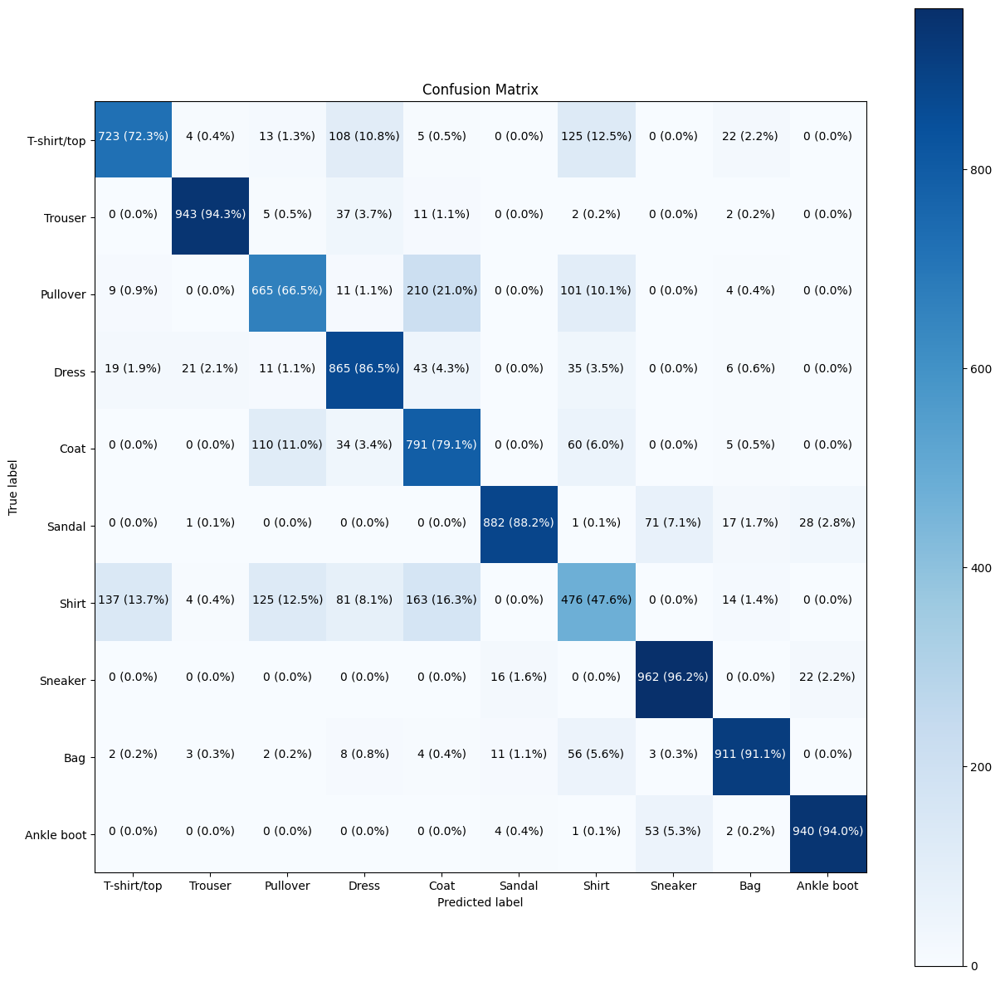

In [ ]:
# Make a prettier confusion matrix:
make_confusion_matrix(y_true = test_labels, 
                      y_pred = y_preds,
                      classes = class_names, 
                      figsize = (15, 15),
                      text_size = 10)

**NOTE:** Often when working with images and other forms of visual data, a good idea would be to visualize as much as possible in order to develop a deeper understanding of the data inputs as well as the outputs of our models.

Let's create a little function to:
* Plot a random image
* Predict on the image in question 
* Label the plot with the truth label AND the predicted label

In [ ]:
import random

# Creating function:
def plot_random_image(model, images, true_labels, classes):
  """ Picks a random image, plots it and labels it with a prediction and truth label.
  """
  # Setting a random integer:
  i = random.randint(0, len(images)) # i will be a random integer number between 0 and the length of images, and images will be the images we define later we want to check out

  # Creating predicitons and targets:
  target_image = images[i]
  pred_probs = model.predict(target_image.reshape(1, 28, 28)) # 28, 28 because it's the shape of the images, AND 1 because we are only predicting one image!
  pred_label = classes[pred_probs.argmax()] # Getting the one with the highest probability, so we make sure it's the right one
  true_label = classes[true_labels[i]]

  # Plot the image:
  plt.imshow(target_image, cmap = plt.cm.binary) 

  # Chaneg the color of the titles depending on whether the prediciton is right/wrong:
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Add xlabel info (prediction/true label):
  plt.xlabel("Pred: {} {:2.0f}% (True: {})".format(pred_label, 
                                                   100*tf.reduce_max(pred_probs), 
                                                   true_label), 
             color = color) # Set the color to green or red based on if the prediction is right/wrong



1/1 [==============================] - 0s 21ms/step


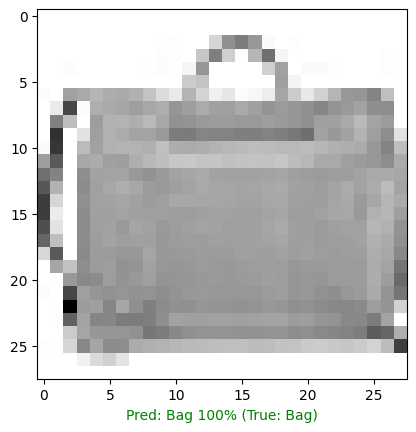

In [ ]:
# Check out a random image and its prediction:
plot_random_image(model = model_14, 
                  images = test_data, # Always make predictions on the same kind of data the model was trained on!!! (In this case, since we overwrote the normalized data over the non-normalized one, it's the same (test_data))
                  true_labels = test_labels, 
                  classes = class_names)

# Which patterns is our model learning?

In [ ]:
# Finding the layers of our most recent model:
model_14.layers

In [ ]:
# Extract a particular layer:
model_14.layers[1]

In [ ]:
# Get the patterns of a layer in our network:
weights, biases = model_14.layers[1].get_weights()

# Shapes:
weights, weights.shape

(array([[-0.12028871,  0.7985321 , -0.5808288 , -1.1378232 ],
        [ 0.71220714, -0.09679484, -0.11632098,  0.7033347 ],
        [ 0.81758696, -0.11211436, -0.39102903,  1.470788  ],
        ...,
        [-0.08217882,  1.2927781 ,  0.09734913, -0.24431196],
        [ 0.70793986,  0.45897883,  0.14610465, -1.1179088 ],
        [ 0.13234818,  0.32299083, -0.07302906, -0.3928627 ]],
       dtype=float32),
 (784, 4))

In [ ]:
# NOW let's check out the bias vector:
biases, biases.shape

(array([-0.03358308, -0.44502306,  1.2601452 ,  0.44847295], dtype=float32),
 (4,))

Every neuron has a bias vector. Each of these is pared with a weights matrix.

The bias vector also gets initialized as zeros (at least in the case of a TensorFlow Dense layer)

The bias vector dictates how much the patterns within the corresponding weigths should influence the next layer.


In [ ]:
model_14.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 784)               0         
                                                                 
 dense_39 (Dense)            (None, 4)                 3140      
                                                                 
 dense_40 (Dense)            (None, 4)                 20        
                                                                 
 dense_41 (Dense)            (None, 10)                50        
                                                                 
Total params: 3,210
Trainable params: 3,210
Non-trainable params: 0
_________________________________________________________________


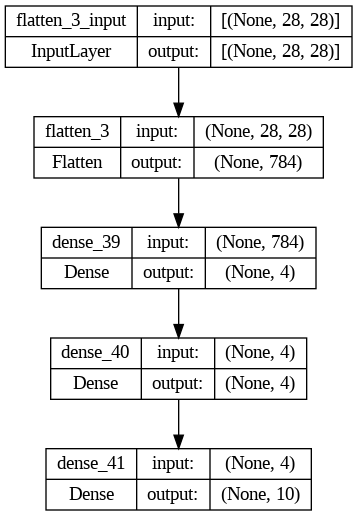

In [ ]:
# Let's check out another way to view our deep learning models:
from tensorflow.keras.utils import plot_model

# See the inputs and outputs of each layer:
plot_model(model_14, show_shapes = True)


# Do Exercises & Extra curriculum! (on github)

**Challenge:** Think of a classification problem you’d like to work on. What are the input shapes (and information to feed to your model)? What are the ideal output shapes (what should your model classify

In [1]:
# Classification dataset with Scikit-learn's make_moons() function, then visualize it, and build a model to fit it at over 85% accuracy 
import tensorflow as tf
# from tensorflow.keras.datasets import the dataset fashion_mnist
from tensorflow.keras.datasets import fashion_mnist

(train_data, train_labels), (test_data, test_labels) = fashion_mnist.load_data() 

4422102/4422102 [==============================] - 0s 0us/step


In [2]:
print(f"Train sample: \n\n{train_data[0]} \n\n Test_sample: {train_labels[0]}")

Train sample: 

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   1   0   0  13  73   0
    0   1   4   0   0   0   0   1   1   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3   0  36 136 127  62
   54   0   0   0   1   3   4   0   0   3]
 [  0   0   0   0   0   0   0   0   0   0   0   0   6   0 102 204 176 134
  144 123  23   0   0   0   0  12  10   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0 155 236 207 178
  107 156 161 109  64  23  77 130  72  15]
 [  0   0   0   0   0   0   0   0   0   0   0   1   0  69 207 223 218 216
  216 163 127 121 122 146 141  88 172  66]
 [  0   0   0   0   0   0   0   0   0   1   1   

In [ ]:
# Check the length of the independent features/variables
len(train_data)

60000

In [ ]:
# Checking the shape of 
train_data[0].shape, train_labels[0].shape # In this case the shape: 28, 28 represents the size of each picture

((28, 28), ())

<function matplotlib.pyplot.show(close=None, block=None)>

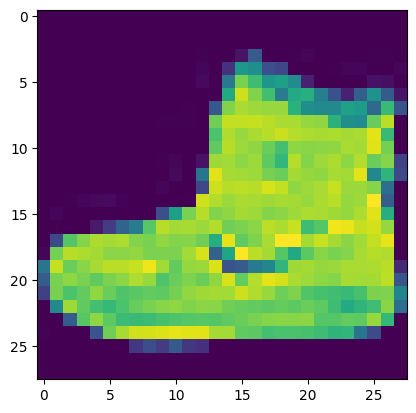

In [3]:
# Plot a picture (a sample) of the dataset
import matplotlib.pyplot as plt

plt.imshow(train_data[0])
plt.show

In [4]:
# Giving a name to all indexes by creating a list containing the names:

class_names = ['T-shirt/top', 
               'Pants', 
               'Sweater', 
               'Dress', 
               'Coat', 
               'Sandal', 
               'Shirt', 
               'Sneaker', 
               'Bag', 
               'Ankle boot'
              ]

len(class_names) 

10

In [ ]:
train_data[0].shape

(28, 28)

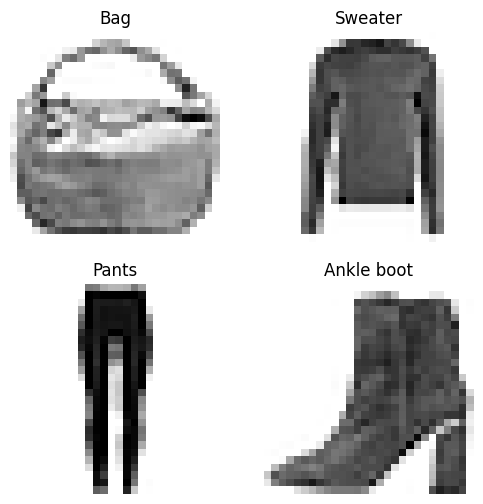

In [5]:
# Plotting a random image and its label:
import random

plt.figure(figsize = (6, 6)) # Setting the image size (we'll show an image with subplots (2 images on top and 2 images in the bottom))

for i in range(4):                                         # Setting range at 4, because we will have 4 ranges (four images, which have 1 range each) used in total
  ax = plt.subplot(2, 2, i+1)

  rand_index = random.choice(range(len(train_data)))       # Setting random number

  plt.imshow(train_data[rand_index], cmap = plt.cm.binary)
  plt.title(class_names[train_labels[rand_index]])
  plt.axis(False)


In [ ]:
# Building our first model:

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_1A = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), # We need to flatten the shape of the input data, because they were in different shapes
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax') # We need 10 neurons, because there are 10 class_names, so there can be 10 outputs
])

# Compile model:
model_1A.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                optimizer = tf.keras.optimizers.Adam(), 
                metrics = ['accuracy'])

# Fit model:
non_norm_history = model_1A.fit(train_data, train_labels, 
                                epochs = 10,
                                validation_data = (test_data, test_labels)) # With this, while fitting the model, it validates how good/bad it's performing

Epoch 1/10
1875/1875 [==============================] - 9s 4ms/step - loss: 2.0201 - accuracy: 0.2140 - val_loss: 1.6614 - val_accuracy: 0.3251
Epoch 2/10
1875/1875 [==============================] - 4s 2ms/step - loss: 1.5403 - accuracy: 0.3617 - val_loss: 1.4737 - val_accuracy: 0.4045
Epoch 3/10
1875/1875 [==============================] - 3s 2ms/step - loss: 1.4267 - accuracy: 0.4044 - val_loss: 1.3869 - val_accuracy: 0.4172
Epoch 4/10
1875/1875 [==============================] - 3s 2ms/step - loss: 1.3706 - accuracy: 0.4215 - val_loss: 1.3441 - val_accuracy: 0.4385
Epoch 5/10
1875/1875 [==============================] - 3s 2ms/step - loss: 1.3292 - accuracy: 0.4354 - val_loss: 1.3199 - val_accuracy: 0.4334
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 1.2883 - accuracy: 0.4486 - val_loss: 1.2889 - val_accuracy: 0.4568
Epoch 7/10
1875/1875 [==============================] - 3s 2ms/step - loss: 1.2611 - accuracy: 0.4549 - val_loss: 1.2697 - val_accuracy:

In [ ]:
model_1A.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 4)                 3140      
                                                                 
 dense_1 (Dense)             (None, 4)                 20        
                                                                 
 dense_2 (Dense)             (None, 10)                50        
                                                                 
Total params: 3,210
Trainable params: 3,210
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Check min and max of our train_data:
train_data.min(), train_data.max(), test_data.min(), test_data.max()

(0, 255, 0, 255)

In [6]:
# Normalizing data:
### It can be done in 2 different ways: dividing the train_data and train_labels into the max value, which in this case is 225 or using the already set TF function

# 1. Hard-coding it:
# train_data_norm = train_data/225
# train_labels_norm = train_labels/225

# 2. Using the normalize keras function (more reliable):
train_data_norm = tf.keras.utils.normalize(train_data, axis = 1)
test_data_norm = tf.keras.utils.normalize(test_data, axis = 1)

In [ ]:
train_data_norm.shape

(60000, 28, 28)

In [7]:
from ast import Lambda
# Rebuilding the model, now with the normalized data:

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_2A = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax')
])

# Compile model:
model_2A.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(), 
                 metrics = ['accuracy'])

# Crearing a learning rate callback
lr_scheduler1 = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-3 * 10**(epoch/20))

# Fit model:
find_lr_norm_history = model_2A.fit(train_data_norm, train_labels, 
                            epochs = 20, 
                            validation_data = (test_data, test_labels), 
                            callbacks = [lr_scheduler1])

Epoch 1/20
1875/1875 [==============================] - 11s 3ms/step - loss: 1.4036 - accuracy: 0.4777 - val_loss: 734.2011 - val_accuracy: 0.4304 - lr: 0.0010
Epoch 2/20
1875/1875 [==============================] - 5s 3ms/step - loss: 0.7755 - accuracy: 0.7280 - val_loss: 940.8069 - val_accuracy: 0.5002 - lr: 0.0011
Epoch 3/20
1875/1875 [==============================] - 7s 4ms/step - loss: 0.5897 - accuracy: 0.7946 - val_loss: 1391.7251 - val_accuracy: 0.4117 - lr: 0.0013
Epoch 4/20
1875/1875 [==============================] - 10s 5ms/step - loss: 0.5405 - accuracy: 0.8147 - val_loss: 1577.9952 - val_accuracy: 0.3982 - lr: 0.0014
Epoch 5/20
1875/1875 [==============================] - 7s 4ms/step - loss: 0.5200 - accuracy: 0.8216 - val_loss: 1549.3221 - val_accuracy: 0.4141 - lr: 0.0016
Epoch 6/20
1875/1875 [==============================] - 11s 6ms/step - loss: 0.5082 - accuracy: 0.8242 - val_loss: 1874.4606 - val_accuracy: 0.3811 - lr: 0.0018
Epoch 7/20
1875/1875 [=================

In [ ]:
loss_values = find_lr_norm_history.history['loss'][:40]
loss_values

[1.926571249961853,
 1.7111443281173706,
 1.5605603456497192,
 1.5045506954193115,
 1.4662915468215942,
 1.429911494255066,
 1.3914486169815063,
 1.3648416996002197,
 1.3474465608596802,
 1.3346843719482422,
 1.325424075126648,
 1.3007771968841553,
 1.2778551578521729,
 1.2666012048721313,
 1.256579041481018,
 1.246319055557251,
 1.2205114364624023,
 1.2078224420547485,
 1.1475409269332886,
 1.1108452081680298]

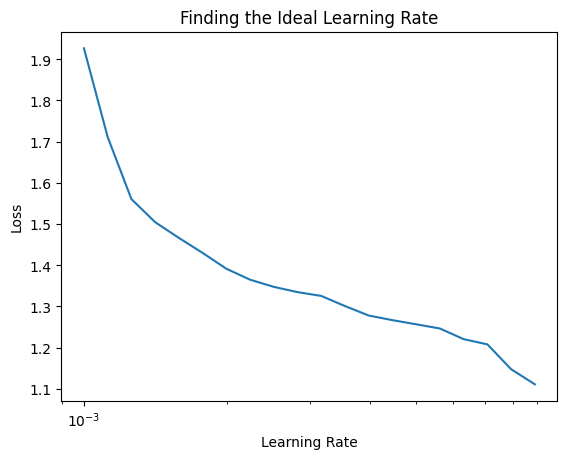

In [ ]:
# Plotting the rate decay curve:

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Assuming `find_lr_norm_history.history['loss']` has 40 elements
loss_values = find_lr_norm_history.history['loss']

lrs = 1e-3 * (10 ** (tf.range(20) / 20))
plt.semilogx(lrs, loss_values)  # Plot all the elements of lrs and loss_values

# Making the plot pretty
plt.xlabel("Learning Rate")
plt.ylabel("Loss")
plt.title("Finding the Ideal Learning Rate")

plt.show()




<Axes: title={'center': 'Normalized Data'}>

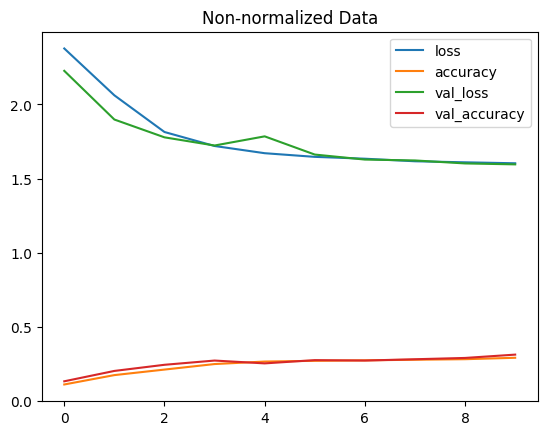

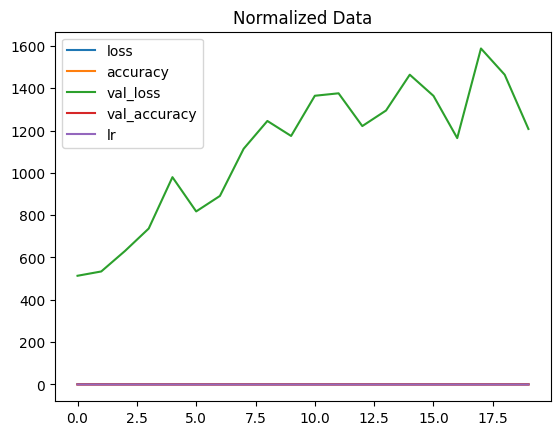

In [ ]:
# Plotting the loss and accuracy scores:
import pandas as pd

# Plot non-normalized data:
pd.DataFrame(non_norm_history.history).plot(title = 'Non-normalized Data')
pd.DataFrame(find_lr_norm_history.history).plot(title = 'Normalized Data')

In [ ]:
# Building model 3A:

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_3A = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'softmax')
])

# Compile model:
model_3A.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), 
                 metrics = ['accuracy'])

# Fit the model:
history_3A = model_3A.fit(train_data_norm, train_labels, 
                          epochs = 30, 
                          validation_data = (test_data_norm, test_labels))

Epoch 1/30
1875/1875 [==============================] - 6s 3ms/step - loss: 1.1452 - accuracy: 0.5326 - val_loss: 0.7243 - val_accuracy: 0.7203
Epoch 2/30
1875/1875 [==============================] - 3s 2ms/step - loss: 0.6330 - accuracy: 0.7643 - val_loss: 0.6390 - val_accuracy: 0.7786
Epoch 3/30
1875/1875 [==============================] - 3s 2ms/step - loss: 0.5645 - accuracy: 0.7979 - val_loss: 0.5878 - val_accuracy: 0.7939
Epoch 4/30
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5348 - accuracy: 0.8086 - val_loss: 0.5622 - val_accuracy: 0.8040
Epoch 5/30
1875/1875 [==============================] - 4s 2ms/step - loss: 0.5169 - accuracy: 0.8150 - val_loss: 0.5504 - val_accuracy: 0.8060
Epoch 6/30
1875/1875 [==============================] - 3s 2ms/step - loss: 0.5036 - accuracy: 0.8192 - val_loss: 0.5460 - val_accuracy: 0.8084
Epoch 7/30
1875/1875 [==============================] - 3s 2ms/step - loss: 0.4937 - accuracy: 0.8233 - val_loss: 0.5418 - val_accuracy:

<Axes: title={'center': 'Normalized Data'}>

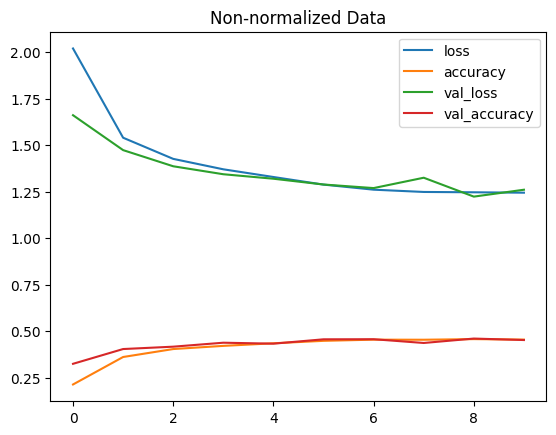

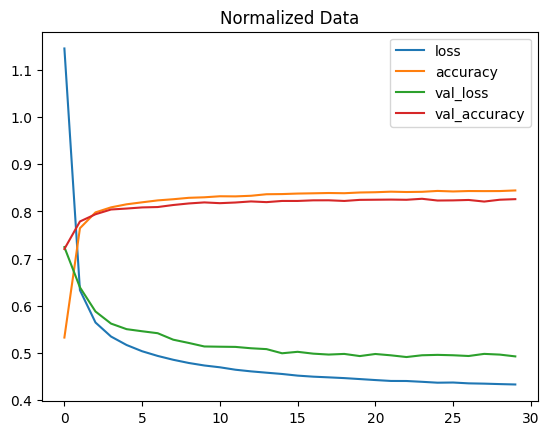

In [ ]:
import pandas as pd

# Plot non-normalized data:
pd.DataFrame(non_norm_history.history).plot(title = 'Non-normalized Data')

# Plot normalized data:
pd.DataFrame(history_3A.history).plot(title = 'Normalized Data')

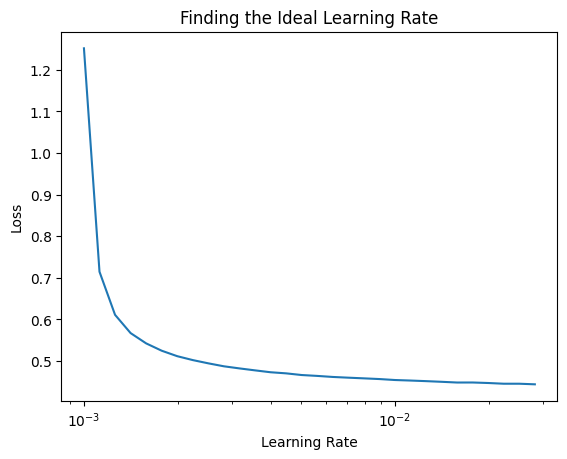

In [ ]:
# Assuming `find_lr_norm_history.history['loss']` has 40 elements
loss_values = history_3A.history['loss']

lrs = 1e-3 * (10 ** (tf.range(30) / 20))
plt.semilogx(lrs, loss_values)  # Plot all the elements of lrs and loss_values

# Making the plot pretty
plt.xlabel("Learning Rate")
plt.ylabel("Loss")
plt.title("Finding the Ideal Learning Rate")

plt.show()


In [9]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

import tensorflow as tf
from datetime import datetime

# Clear any logs from previous runs
# rm -rf logs

# Define the log directory path
log_dir = './logs'

# Create the TensorBoard callback
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='./logs', histogram_freq=1)

In [10]:
# Creating model 4A. Changes: Making the learning rate higher, this may cause the model to get overfitted, so we'll increase it just a little bit

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_4A = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), 
    tf.keras.layers.Dense(10, activation = 'relu'), 
    tf.keras.layers.Dense(4, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax')
])

# Compile model:
model_4A.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0005), 
                 metrics = ['accuracy'])

# Fit model:
history4A = model_4A.fit(train_data_norm, train_labels, 
                         epochs = 30, 
                         validation_data = (test_data_norm, test_labels), 
                         callbacks = [tensorboard_callback])

Epoch 1/30
1875/1875 [==============================] - 9s 4ms/step - loss: 1.2027 - accuracy: 0.6161 - val_loss: 0.7166 - val_accuracy: 0.7605
Epoch 2/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.6209 - accuracy: 0.7839 - val_loss: 0.6134 - val_accuracy: 0.7846
Epoch 3/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.5506 - accuracy: 0.8048 - val_loss: 0.5628 - val_accuracy: 0.8051
Epoch 4/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.5146 - accuracy: 0.8179 - val_loss: 0.5359 - val_accuracy: 0.8141
Epoch 5/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.4918 - accuracy: 0.8256 - val_loss: 0.5188 - val_accuracy: 0.8215
Epoch 6/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.4740 - accuracy: 0.8332 - val_loss: 0.5071 - val_accuracy: 0.8312
Epoch 7/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.4607 - accuracy: 0.8371 - val_loss: 0.5205 - val_accuracy:

In [11]:
pd.DataFrame(non_norm_history.history).plot(title = 'Non-normalized Data Model 1A')
pd.DataFrame(history_3A.history).plot(title = 'Normalized Data Model 3A')
pd.DataFrame(history4A.history).plot(title = 'Normalized Data Model 4A')


NameError: ignored

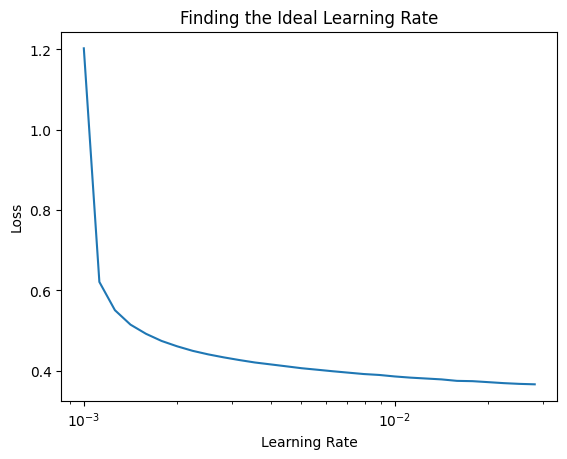

In [12]:
# Plotting a learnign rate curve:
loss_values = history4A.history['loss']

lrs = 1e-3 * (10**(tf.range(30)/20))
plt.semilogx(lrs, loss_values)

# making plot prettier:
plt.xlabel('Learning Rate')
plt.ylabel('Loss')
plt.title('Finding the Ideal Learning Rate')

plt.show()

In [13]:
#Creating a model with an accuracy of 88%+  

# Setting random seed:
tf.random.set_seed(42)

# Create model:
model_5A = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), 
    tf.keras.layers.Dense(100, activation = 'relu'), 
    tf.keras.layers.Dense(50, activation = 'relu'), 
    tf.keras.layers.Dense(20, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax')
])

# Compile model:
model_5A.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(), 
                 metrics = ['accuracy'])

# Fit model:
history5A = model_5A.fit(train_data_norm, train_labels, 
                         epochs = 30, 
                         validation_data = (test_data_norm, test_labels))

Epoch 1/30
1875/1875 [==============================] - 8s 3ms/step - loss: 0.5251 - accuracy: 0.8104 - val_loss: 0.4243 - val_accuracy: 0.8465
Epoch 2/30
1875/1875 [==============================] - 7s 3ms/step - loss: 0.3728 - accuracy: 0.8632 - val_loss: 0.4395 - val_accuracy: 0.8453
Epoch 3/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3361 - accuracy: 0.8749 - val_loss: 0.3814 - val_accuracy: 0.8608
Epoch 4/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3114 - accuracy: 0.8849 - val_loss: 0.3832 - val_accuracy: 0.8607
Epoch 5/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2951 - accuracy: 0.8890 - val_loss: 0.3766 - val_accuracy: 0.8659
Epoch 6/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2796 - accuracy: 0.8948 - val_loss: 0.3711 - val_accuracy: 0.8627
Epoch 7/30
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2673 - accuracy: 0.8991 - val_loss: 0.3739 - val_accuracy:

In [14]:
# Let's see if we can bring the accuracy score up to 90%

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_6A = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), 
    tf.keras.layers.Dense(200, activation = 'relu'), 
    tf.keras.layers.Dense(100, activation = 'relu'), 
    tf.keras.layers.Dense(100, activation = 'relu'), 
    # tf.keras.layers.Dense(50, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = 'softmax')
])

# Compile model:
model_6A.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0009), 
                 metrics = ['accuracy'])

# Fit model:
history6A = model_6A.fit(train_data_norm, train_labels, 
                         epochs = 40, 
                         validation_data = (test_data_norm, test_labels))

Epoch 1/40
1875/1875 [==============================] - 8s 3ms/step - loss: 0.4924 - accuracy: 0.8195 - val_loss: 0.4029 - val_accuracy: 0.8553
Epoch 2/40
1875/1875 [==============================] - 6s 3ms/step - loss: 0.3569 - accuracy: 0.8671 - val_loss: 0.4405 - val_accuracy: 0.8420
Epoch 3/40
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3215 - accuracy: 0.8801 - val_loss: 0.3665 - val_accuracy: 0.8667
Epoch 4/40
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2980 - accuracy: 0.8878 - val_loss: 0.3627 - val_accuracy: 0.8673
Epoch 5/40
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2787 - accuracy: 0.8945 - val_loss: 0.3476 - val_accuracy: 0.8735
Epoch 6/40
1875/1875 [==============================] - 6s 3ms/step - loss: 0.2613 - accuracy: 0.9003 - val_loss: 0.3703 - val_accuracy: 0.8627
Epoch 7/40
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2484 - accuracy: 0.9055 - val_loss: 0.3593 - val_accuracy:

In [ ]:
# Hard-coding the softmax function into the model. 

# Define softmax activation function
def softmax(x):
    return tf.exp(x) / tf.reduce_sum(tf.exp(x), 
                                     axis = -1, 
                                     keepdims = True)

# Set random seed:
tf.random.set_seed(42)

# Create model:
model_7A = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)), 
    tf.keras.layers.Dense(200, activation = 'relu'), 
    tf.keras.layers.Dense(100, activation = 'relu'), 
    tf.keras.layers.Dense(100, activation = 'relu'), 
    # tf.keras.layers.Dense(50, activation = 'relu'), 
    tf.keras.layers.Dense(10, activation = softmax)
])

# Compile model:
model_7A.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(), 
                 optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0009), 
                 metrics = ['accuracy'])

# Fit model:
history7A = model_7A.fit(train_data_norm, train_labels, 
                         epochs = 40, 
                         validation_data = (test_data_norm, test_labels))




Epoch 1/40
1875/1875 [==============================] - 11s 5ms/step - loss: 0.4879 - accuracy: 0.8203 - val_loss: 0.3989 - val_accuracy: 0.8535
Epoch 2/40
1875/1875 [==============================] - 10s 5ms/step - loss: 0.3585 - accuracy: 0.8673 - val_loss: 0.4025 - val_accuracy: 0.8547
Epoch 3/40
1875/1875 [==============================] - 10s 5ms/step - loss: 0.3208 - accuracy: 0.8801 - val_loss: 0.3668 - val_accuracy: 0.8659
Epoch 4/40
1875/1875 [==============================] - 10s 5ms/step - loss: 0.2959 - accuracy: 0.8897 - val_loss: 0.3496 - val_accuracy: 0.8683
Epoch 5/40
1875/1875 [==============================] - 10s 6ms/step - loss: 0.2778 - accuracy: 0.8954 - val_loss: 0.3568 - val_accuracy: 0.8708
Epoch 6/40
1875/1875 [==============================] - 10s 5ms/step - loss: 0.2599 - accuracy: 0.9011 - val_loss: 0.3598 - val_accuracy: 0.8672
Epoch 7/40
1875/1875 [==============================] - 10s 5ms/step - loss: 0.2496 - accuracy: 0.9061 - val_loss: 0.3485 - val_ac

In [ ]:
model_6A.evaluate(test_data_norm, test_labels)

313/313 [==============================] - 1s 2ms/step - loss: 0.5503 - accuracy: 0.8949


[0.5502920746803284, 0.8949000239372253]

In [15]:
# Creating a Confusion Matrix function to use it later:

import itertools
from sklearn.metrics import confusion_matrix

# Creating the function. NOTE: the name must be different from sklearn's plot_confusion_matrix
def plotting_confusion_matrix(y_true, y_pred, classes = None, figsize = (10, 10), text_size = 15):

  # Creating Confusion Matrix:
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis = 1)[:, np.newaxis] # Normalizing it
  n_classes = cm.shape[0] # Finding out the number of classes we're dealing with

  # Plotting the CM and making it pretty:
  fig, ax = plt.subplots(figsize = figsize)
  cax = ax.matshow(cm, cmap = plt.cm.Blues) # Making darker colors represent better results
  fig.colorbar(cax)

  # Is there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes:
  ax.set(title = 'Confusion Matrix', 
          xlabel = 'Predicted label', 
          ylabel = 'True label',
          xticks = np.arange(n_classes), 
          yticks = np.arange(n_classes), 
          xticklabels = labels, 
          yticklabels = labels)
  
  # Making the axis labels appear on the bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  # Setting the threshhold for different colors:
  threshold = (cm.max() + cm.min()) / 2.

  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)", 
             horizontalalignment = 'center', 
             color = 'white' if cm[i, j] > threshold else "black", 
             size = text_size)

In [16]:
# Making predictions of model_4A

y_probs = model_5A.predict(test_data_norm)

y_probs[:5]

313/313 [==============================] - 1s 2ms/step


array([[1.63260993e-04, 5.69826816e-18, 3.87923221e-10, 1.89099691e-11,
        9.82717054e-14, 1.32176766e-07, 8.05693912e-09, 4.15974546e-06,
        8.14178609e-04, 9.99018192e-01],
       [3.57230351e-06, 1.57308405e-16, 9.99585569e-01, 3.51254220e-10,
        2.77220504e-04, 2.71449063e-09, 1.33632711e-04, 9.15426207e-11,
        2.20680736e-08, 7.61502406e-13],
       [3.18023581e-12, 1.00000000e+00, 5.61126240e-18, 2.02604521e-14,
        3.37568677e-22, 3.07258080e-20, 3.87010809e-16, 8.31524955e-31,
        5.91017032e-18, 1.32479890e-24],
       [1.01173184e-11, 1.00000000e+00, 7.29302832e-16, 3.89113151e-11,
        8.71887786e-20, 8.06687782e-19, 6.58227813e-14, 3.56417564e-27,
        2.87385805e-17, 1.78962862e-23],
       [9.56114352e-01, 3.01545017e-14, 1.26797811e-03, 1.10637461e-06,
        1.65318579e-05, 2.31491286e-13, 4.26000580e-02, 1.10052245e-12,
        8.14173229e-10, 6.69939957e-15]], dtype=float32)

In [17]:
y_probs[0].argmax(), class_names[y_probs[0].argmax()]

(9, 'Ankle boot')

In [18]:
# Converting all prediciton variables into integers:
y_preds = y_probs.argmax(axis = 1)
y_preds[:10]

array([9, 2, 1, 1, 0, 1, 4, 6, 5, 7])

In [ ]:
test_labels

array([9, 2, 1, ..., 8, 1, 5], dtype=uint8)

In [19]:
model_5A.evaluate(test_data_norm, test_labels) # Alway remember to use the data used to train, evaluate the model. In this case NORMALIZED DATA!!!

313/313 [==============================] - 1s 2ms/step - loss: 0.4706 - accuracy: 0.8764


[0.4705982506275177, 0.8763999938964844]

In [20]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_true = test_labels, 
                 y_pred = y_preds)

array([[869,   1,  18,  17,   3,   2,  88,   0,   2,   0],
       [  5, 962,   7,  20,   0,   0,   3,   0,   3,   0],
       [ 15,   2, 854,   6,  65,   1,  54,   0,   3,   0],
       [ 33,   1,  24, 861,  34,   0,  38,   0,   9,   0],
       [  1,   1, 185,  32, 754,   0,  25,   0,   2,   0],
       [  0,   0,   3,   0,   0, 957,   1,  20,   0,  19],
       [156,   1, 125,  18,  72,   0, 618,   0,  10,   0],
       [  0,   0,   0,   0,   0,  18,   0, 936,   2,  44],
       [  3,   2,   2,   1,   0,   3,  11,   2, 976,   0],
       [  0,   0,   1,   0,   0,   6,   0,  16,   0, 977]])

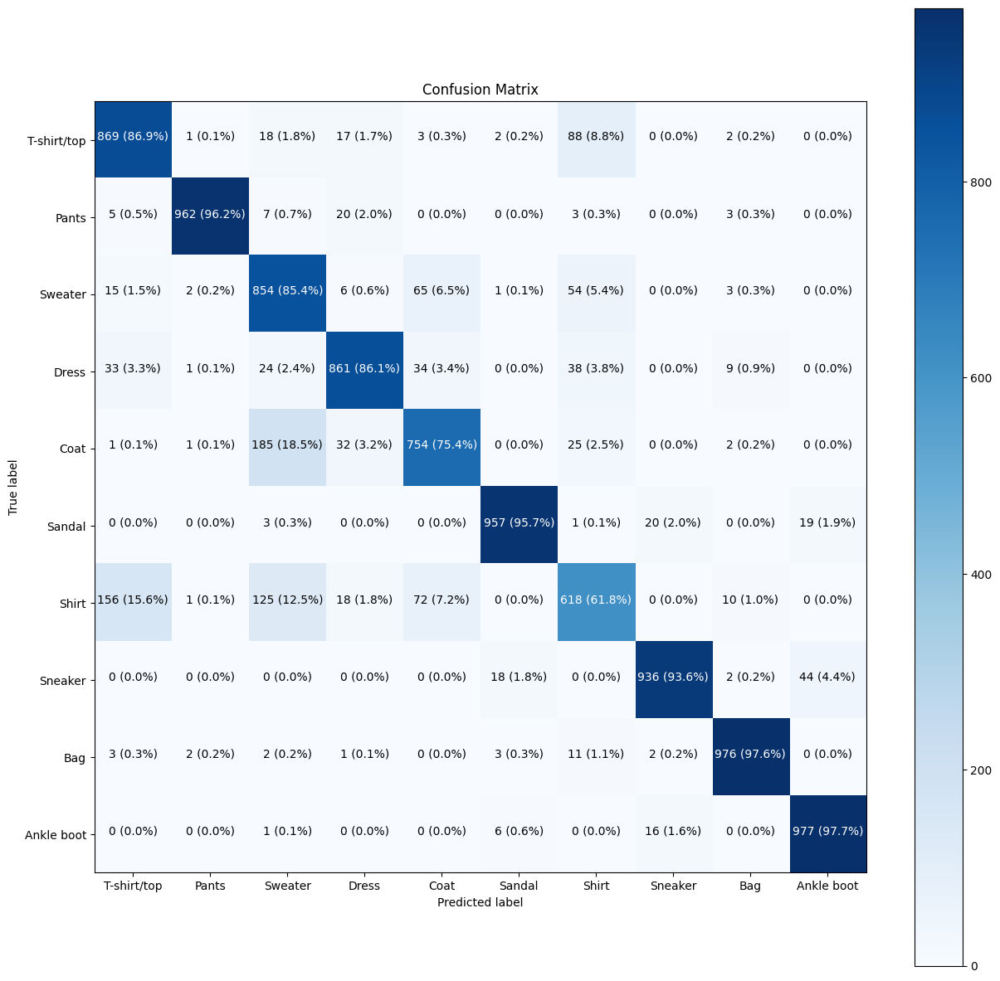

In [22]:
import numpy as np
# Making the Confusion Matrix above, prettier: (Using the function defined before!)
plotting_confusion_matrix(y_true = test_labels, 
                          y_pred = y_preds, 
                          classes = class_names, 
                          figsize = (15, 15), 
                          text_size = 10)

In [21]:
# Showing/plotting random pictures with their labels in blue/red based on whether they are predicted correctly or not:

import random
# Creating function for it:
def plotting_random_image(model, images, true_labels, classes):

  # Setting a random integer:
  i = random.randint(0, len(images)) # i wil be a random integer number between 0 and the length of images
  
  # Creating predictions and targets:
  target_image = images[i]
  pred_probs = model.predict(target_image.reshape(1, 28, 28)) # 28, 28 because it's the shape of the images, AND 1 because we are only predicting one image!
  pred_label = classes[pred_probs.argmax()] # Getting the one with the highest probability, so we make sure it's the right one
  true_label = classes[true_labels[i]]

  # Plot the image:
  plt.imshow(target_image, cmap = plt.cm.binary)

  # Change the color of the titles depending on whether the prediction is right/wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'
  
  # Add xlabel:
  plt.xlabel('Pred: {} {:.2f}% (True: {})'.format(pred_label, 
                                                    100*tf.reduce_max(pred_probs), 
                                                    true_label), 
             color = color)


  # # Change the color of the titles depending on whether the prediction is right/wrong
  # if pred_label == true_label:
  #     color = 'green'
  # else:
  #     color = 'red'

  # # Add xlabel:
  # plt.xlabel('Pred: {} {:.2f}% (True: {})'.format(pred_label,
  #                                                 100 * tf.reduce_max(pred_probs),
  #                                                 true_label),
  #           color=color)


1/1 [==============================] - 0s 43ms/step


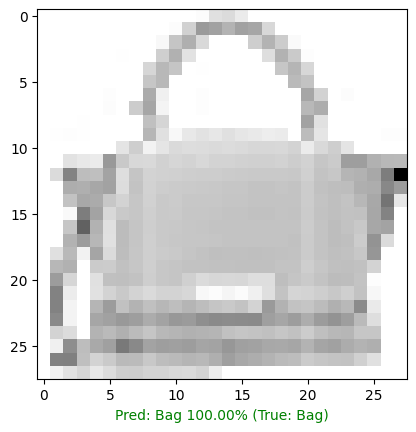

In [23]:
# Plotting it:
plotting_random_image(model = model_5A, 
                      images = test_data_norm, 
                      true_labels = test_labels, 
                      classes = class_names)

In [57]:
import random
import matplotlib.pyplot as plt
import numpy as np

def plotting_multiple_random_images(model, images, true_labels, classes, fontsize=12):
    # Setting random indices for four images:
    indices = random.sample(range(len(images)), 4)

    # Create a subplot with four axes for images and graphs:
    fig, axes = plt.subplots(2, 4, figsize=(11, 5.8))
    axes = axes.flatten()  # Flatten the 2D axes array to 1D for easier indexing

    predictions = []  # Initialize an empty list for storing predictions

    for i, ax in enumerate(axes):
        if i % 2 == 0:
            # Display the image
            image_index = indices[i // 2]
            target_image = images[image_index]
            true_label = classes[true_labels[image_index]]

            # Predict the label for the image:
            pred_probs = model.predict(target_image.reshape(1, 28, 28))
            pred_label = classes[pred_probs.argmax()]
            pred_prob = np.max(pred_probs)

            # Add the prediction to the list
            predictions.append((pred_label, pred_prob))

            # Plot the image:
            ax.imshow(target_image, cmap=plt.cm.binary)
            ax.set_xticks([])
            ax.set_yticks([])

            # Change the color of the titles depending on whether the prediction is right/wrong
            if pred_label == true_label:
                color = 'green'
            else:
                color = 'red'

            # Add xlabel:
            ax.set_xlabel('Pred: {} {:.2f}% (True: {})'.format(pred_label,
                                                                100 * pred_prob,
                                                                true_label),
                          color=color)
        else:
            # Display the bar graph
            graph_index = (i - 1) // 2
            pred_label, pred_prob = predictions[graph_index]

            # Determine the color for the bar based on prediction correctness and class name frequency:
            color = 'gray'  # Default color
            if pred_label == true_label:
                color = 'blue'  # Correctly predicted
            elif pred_prob < 0.5:
                color = 'red'  # Wrongly predicted

            # Create the bar graph:
            ax.bar([0, 1], [pred_prob, 1 - pred_prob], color=color)
            ax.set_xticks([0, 1])
            ax.set_xticklabels(['Predicted', 'Others'])
            ax.set_ylim([0, 1])
            ax.set_ylabel('Probability')
            ax.set_title('Prediction Bar Graph')

    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 33ms/step


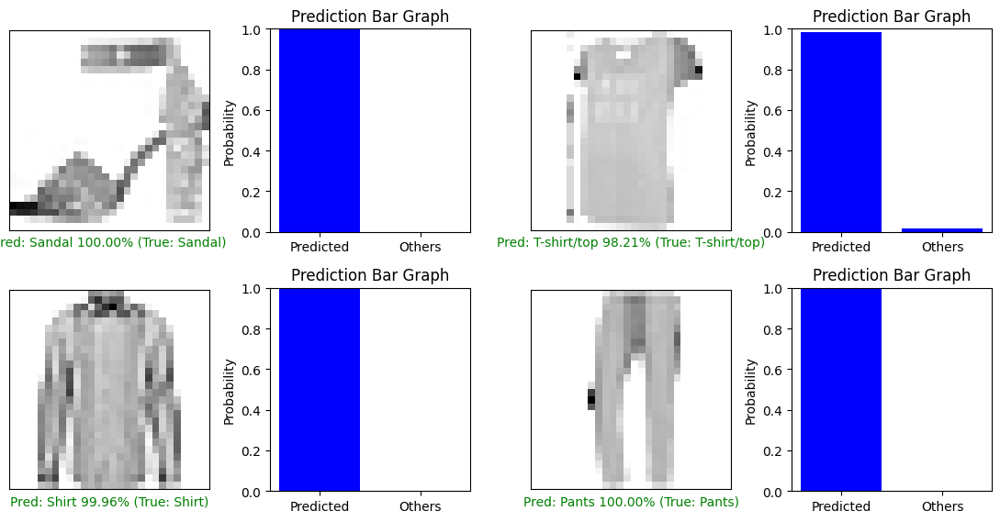

In [58]:
plotting_multiple_random_images(model_5A, 
                                images = train_data_norm, 
                                true_labels = train_labels, 
                                classes = class_names)

In [50]:
def plot_class_images(model, images, labels, classes, class_label, num_images=3):
    # Filter images and labels based on the specified class label
    class_indices = np.where(labels == class_label)[0]
    selected_indices = np.random.choice(class_indices, size=num_images, replace=False)
    selected_images = images[selected_indices]
    selected_labels = labels[selected_indices]

    # Make predictions on the selected images
    predictions = model.predict(selected_images)

    # Plot the images and predictions
    fig, axes = plt.subplots(1, num_images, figsize=(10, 3))

    for i in range(num_images):
        ax = axes[i]
        ax.imshow(selected_images[i], cmap=plt.cm.binary)
        ax.set_xticks([])
        ax.set_yticks([])

        pred_label = np.argmax(predictions[i])
        true_label = selected_labels[i]
        pred_prob = np.max(predictions[i])

        if pred_label == true_label:
            color = 'green'
        else:
            color = 'red'

        ax.set_xlabel('Pred: {} {:.2f}% (True: {})'.format(classes[pred_label], pred_prob * 100, classes[true_label]), color=color)
        ax.set_title('True Label: ' + classes[true_label], fontsize=10, color='black', y=-0.2)  # Add 'True Label' text

    plt.tight_layout()
    plt.show()


In [1]:
plot_class_images(model=model_5A,
                  images=train_data_norm,
                  labels=train_labels,
                  classes=class_names,
                  class_label=class_names.index('T-shirt/top'))


NameError: name 'plot_class_images' is not defined

In [24]:
# Finding patterns of the latest model (best-performing one(model_4A))
model_4A.layers

In [25]:
# Extract a particular layer:
model_4A.layers[1]

In [26]:
model_4A.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 784)               0         
                                                                 
 dense_6 (Dense)             (None, 10)                7850      
                                                                 
 dense_7 (Dense)             (None, 4)                 44        
                                                                 
 dense_8 (Dense)             (None, 10)                50        
                                                                 
Total params: 7,944
Trainable params: 7,944
Non-trainable params: 0
_________________________________________________________________


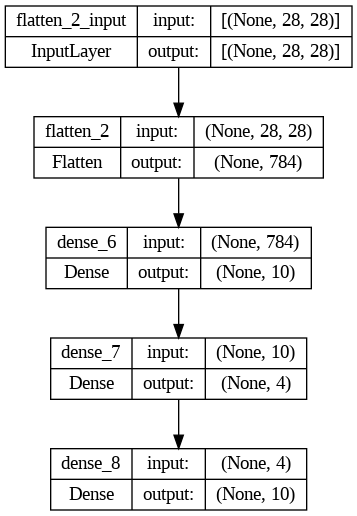

In [27]:
# Plotting the model VISUALLY:
from tensorflow.keras.utils import plot_model

# Showing the inputs and outputs of each layer:
plot_model(model_4A, 
           show_shapes = True)

In [28]:
tensorboard --logdir=./logs


<IPython.core.display.Javascript object>

In [29]:
model_5A.evaluate(test_data_norm, test_labels)

313/313 [==============================] - 1s 2ms/step - loss: 0.4706 - accuracy: 0.8764


[0.4705982506275177, 0.8763999938964844]